# <u> Yelp Dataset Final Porject </u>
## - A trove of reviews, businesses, tips data

# <u> 1 Data Description </u>

We primarily focused on studying two datasets: a business dataset and a reviews dataset.

Each row of the business dataset described a unique address of a business listed on yelp. In this dataset, there were various attributes describing the business such as location, business name, address, average rating, etc. This set was initally composed of approximately 200 thousand rows and a dozen attributes. After data cleaning, the number of attributes increased, as we expanded the nested dictionary values contained within the column titled 'attributes'.

Each row of the review dataset represents a unique review given to the various businesses within the business dataset. The main attributes within the review dataset is the star rating given, the business id (used to match the review to a business within the review dataset), as well actual text of the given review. This dataset is mostly made up of text data. And it is made up of 6.6 million rows, each of which represents a unique review. Therefore iterating through this to extract information takes quite a bit of time, as we are not only iterating through a large dataset, but also iterating through text data of various lengths within each cycle.

## 1.1 <u> Business dataset </u>: Data Exploration Through Visualization

In this section, we'll try and gain an extra layer of understanding of our raw data through some maps and graphs. 

### 1.1.1 Data import 

In [1]:
# print all the outputs in a cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import warnings
warnings.filterwarnings('ignore')

import json
import pandas as pd
import numpy as np
pd.set_option('display.max_columns',200)

In [5]:
!ls yelp-dataset

yelp_academic_dataset_business.json


In [6]:
yelp_business = []
for line in open('yelp-dataset/yelp_academic_dataset_business.json','r'):
    yelp_business.append(json.loads(line))

In [7]:
business = pd.DataFrame(yelp_business)
len(business)
business.head()

192609

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state
0,2818 E Camino Acequia Drive,{'GoodForKids': 'False'},1SWheh84yJXfytovILXOAQ,"Golf, Active Life",Phoenix,None,0,33.522143,-112.018481,Arizona Biltmore Golf Club,85016,5,3.0,AZ
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMe...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported...",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON
2,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC
3,"15655 W Roosevelt St, Ste 237",None,xvX2CttrVhyG2z1dFg_0xw,"Insurance, Financial Services",Goodyear,"{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ...",1,33.455613,-112.395596,Farmers Insurance - Paul Lorenz,85338,3,5.0,AZ
4,"4209 Stuart Andrew Blvd, Ste F","{'BusinessAcceptsBitcoin': 'False', 'ByAppoint...",HhyxOkGAM07SRYtlQ4wMFQ,"Plumbing, Shopping, Local Services, Home Servi...",Charlotte,"{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",1,35.190012,-80.887223,Queen City Plumbing,28217,4,4.0,NC


### 1.1.2 Mapping by state abbreviation 

In [8]:
import chart_studio
import chart_studio.plotly as py
from plotly.graph_objs import *

In [11]:
df_state = pd.DataFrame(business.groupby('state')['stars'].count())
df_state.reset_index(inplace=True)
df_state.head()

,state,stars
0,AB,8012
1,AK,2
2,AL,3
3,AR,1
4,AZ,56686


In [12]:
chart_studio.tools.set_credentials_file(username='floralan212', api_key='bU45WmvOxH9GVPIG6dXL')

In [20]:
scl = [[0.0, 'rgb(242,240,247)'],[0.2, 'rgb(218,218,235)'],[0.4, 'rgb(188,189,220)'],\
            [0.6, 'rgb(158,154,200)'],[0.8, 'rgb(117,107,177)'],[1.0, 'rgb(84,39,143)']]


#Set a columnn with the text that will appear in each state:
df_state['text'] = df_state['state']

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        #We need to pass the list of the state abbreviations
        locations = df_state['state'],
        #We pass the value of each state
        z = df_state['stars'].astype(float),
        locationmode = 'USA-states',
        #pass the column text
        text = df_state['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            #Title of the color bar
            title = "count")
        ) ]

layout = dict(
        title = 'Yelp data business data',
        geo = dict(
            scope='world',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='d3-cloropleth-map' )

<xxx> As illustrated above, based on our pre-cleaned business dataset, most of our establishments lie within the states of Arizona and Nevada. This will be important to consider later on when we're doing more of a micro, regional analysis of businesses.

### 1.1.3 Top ten business count by city

In [171]:
import seaborn as sns
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [172]:
city_10 = pd.DataFrame(business.city.value_counts()[:10])
city_10.reset_index(inplace=True)

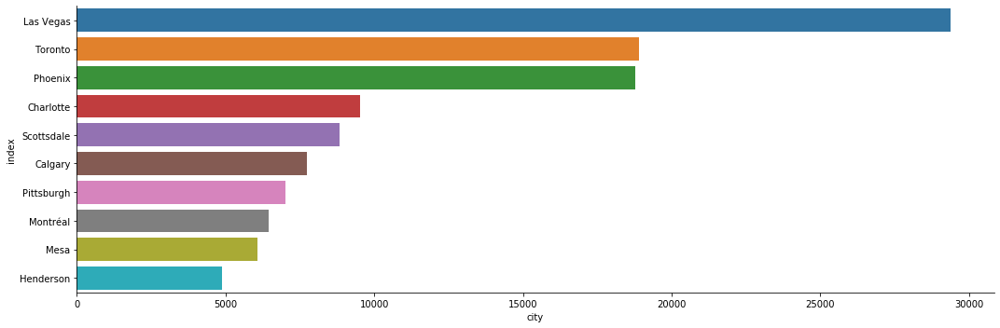

In [173]:
sns.factorplot(x='city',y='index',data=city_10,kind='bar',aspect=3)

<xxx> This validates our initial state-wide findings. The most prominent cities lie within the metro areas within Nevada (Las Vegas) and Arizona (Phoenix, Scottsdale, Mesa).

### 1.1.4 Mapbox by latitude and longitude

In [14]:
df_lati_longti = business.copy()

In [16]:
import plotly.express as px
# Go to mapbox and get your own token 
# Alan's Mapbox token (reference only): pk.eyJ1IjoiYWxhbnR6dGFuIiwiYSI6ImNqa2VqeHFnejB1dTEzcHBxczBhaGZhZ2gifQ.moVxmxTkE53tZDfBFr3uYA

px.set_mapbox_access_token ='pk.eyJ1IjoiZmxvcmFsYW4yMTIiLCJhIjoiY2szbTZseG5xMWNoNjNqbXZsMHVjbGlmMCJ9.QjIj_aK8Ks_LSt2N3gdzPw'
fig = px.scatter_mapbox(df_lati_longti, lat="latitude", lon="longitude", color="stars",\
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
fig.update_layout(mapbox_style="carto-positron",\
                  mapbox_zoom=9, mapbox_center = {"lat": 33.30, "lon": -112.03})
#fig.show()

<xxx> This provides a visualization of an important aspect of the above bar chart. Here, we're able to visualize through specific coordinates (latitude and longitude), the disbursement of these establishments in Arizona at the intersections of the Phoenix, Scottsdale, and Mesa metro areas. The validates the high presence of reviewed establishments within Arizona.

### 1.1.5 Word cloud by categories

In [17]:
df_cat = business.copy()
df_cat['categories'].head()

0                                    Golf, Active Life
1    Specialty Food, Restaurants, Dim Sum, Imported...
2                    Sushi Bars, Restaurants, Japanese
3                        Insurance, Financial Services
4    Plumbing, Shopping, Local Services, Home Servi...
Name: categories, dtype: object

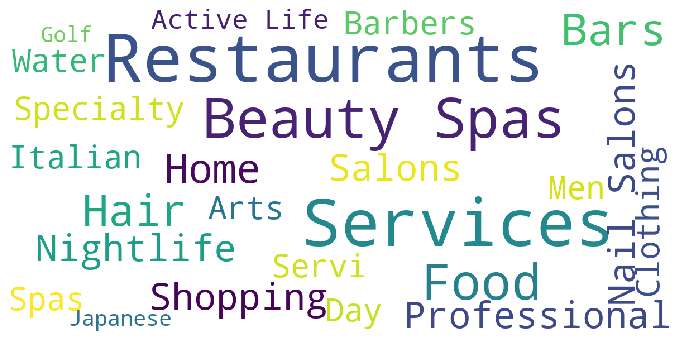

In [19]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=25,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

show_wordcloud(df_cat['categories'])
#show_wordcloud(df['categories'])

As illustrated in this wordcloud, these are the most frequent categories that appear in our initial dataset. We can see just from eyeballing that a good amount of the businesses revolve around food-service and dining.

### 1.1.6 Business names appear the most

In [178]:
business.groupby('name')['name'].count().nlargest(10)
freq_places=business.groupby("name")["name"].count().nlargest(10)

name
Starbucks        1066
McDonald's        806
Subway            768
Tim Hortons       333
Pizza Hut         320
Taco Bell         313
Burger King       302
Walgreens         301
Wendy's           294
The UPS Store     279
Name: name, dtype: int64

In [179]:
freq_places_df=pd.DataFrame(freq_places)

In [180]:
freq_places_df['id']=list(freq_places_df.index)

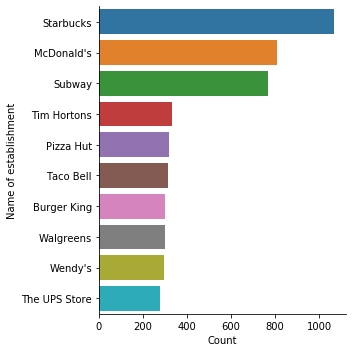

In [181]:
sns.factorplot(x='name',y='id',data=freq_places_df,kind='bar').set(xlabel='Count',ylabel='Name of establishment')

These are the most frequented businsses chains that appear in our dataset. The previous wordcloud visual established that most of the businesses are food-related. Over here, we confirm that one step further, as most of the chains that appear are food related, specifically fast-food related.

### 1.1.7 Top ten categories 

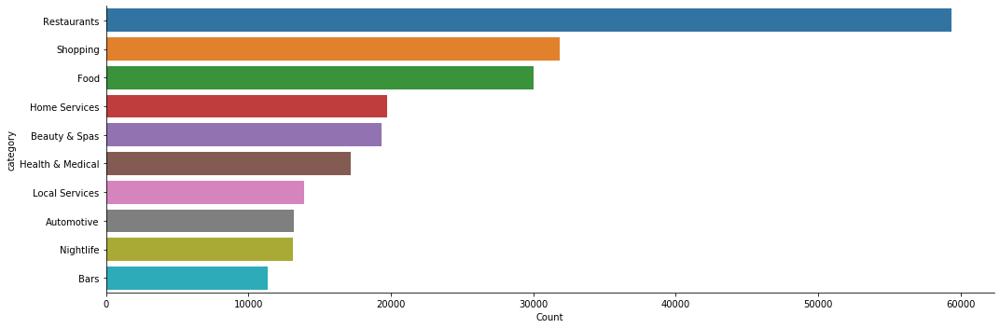
- will be ellaborated using cleaned data

Over here, in a neater visual, we once again reassure the importance of food-related services in our data. Right now, we are making a graph with our intial data. In our intial data, the categories attribute lists multiple categories for each row. Later, when we do data cleaning, we'll have a new dataframe which assigns only one category for each row. (**Refer to Section 2.1.9 for information on this**)

## 1.2 <u> Review dataset </u>

<xxx> Our review dataset contains approximately 6.6 million rows, mostly with text data. As a consequence of this, run time is extremely long. Not only do we have to iterate through 6.6 million rows, but within each row, we have to iterate through paragraphs of text data to find necessary information. 
    
Later on, we'll attempt a sentiment analysis in which we iterate through each review and count the number of positive, negative, and stopwords within each text. The reason this process takes so long is because it has multiple layers. In one cycle, we are iterating through a list of pos/neg/stop words, then iterating through a list of words within the review, and then comparing to see what category the word falls under. 

For now, we'll do a higher level analysis on the most frequent words that appear within positive and negative reviews.

### 1.2.1 Wordcloud by comments

In [182]:
review = pd.read_csv('yelp_academic_dataset_review_SentimentAttached.csv')


In [183]:
review.head()

,Unnamed: 0,business_id,cool,date,funny,review_id,stars,text,useful,user_id,negative_words,positive_words,stop_words
0,0,ujmEBvifdJM6h6RLv4wQIg,0,2013-05-07 04:34:36,1,Q1sbwvVQXV2734tPgoKj4Q,1.0,total bill for this horrible service? over $8gs. these crooks actually had the nerve to charge us $69 for 3 pills. i checked online the pills can be had for 19 cents each! avoid hospital ers at all costs.,6.0,hG7b0MtEbXx5QzbzE6C_VA,2.0,0.0,18.0
1,1,NZnhc2sEQy3RmzKTZnqtwQ,0,2017-01-14 21:30:33,0,GJXCdrto3ASJOqKeVWPi6Q,5.0,"i *adore* travis at the hard rock's new kelly cardenas salon! i'm always a fan of a great blowout and no stranger to the chains that offer this service; however, travis has taken the flawless blowout to a whole new level! \n\ntravis's greets you with his perfectly green swoosh in his otherwise perfectly styled black hair and a vegas-worthy rockstar outfit. next comes the most relaxing and incredible shampoo -- where you get a full head message that could cure even the very worst migraine in minutes --- and the scented shampoo room. travis has freakishly strong fingers (in a good way) and use the perfect amount of pressure. that was superb! then starts the glorious blowout... where not one, not two, but three people were involved in doing the best round-brush action my hair has ev...",0.0,yXQM5uF2jS6es16SJzNHfg,4.0,25.0,163.0
2,2,WTqjgwHlXbSFevF32_DJVw,0,2016-11-09 20:09:03,0,2TzJjDVDEuAW6MR5Vuc1ug,5.0,"i have to say that this office really has it together, they are so organized and friendly! dr. j. phillipp is a great dentist, very friendly and professional. the dental assistants that helped in my procedure were amazing, jewel and bailey helped me to feel comfortable! i don't have dental insurance, but they have this insurance through their office you can purchase for $80 something a year and this gave me 25% off all of my dental work, plus they helped me get signed up for care credit which i knew nothing about before this visit! i highly recommend this office for the nice synergy the whole office has!",3.0,n6-Gk65cPZL6Uz8qRm3NYw,0.0,11.0,70.0
3,3,ikCg8xy5JIg_NGPx-MSIDA,0,2018-01-09 20:56:38,0,yi0R0Ugj_xUx_Nek0-_Qig,5.0,"went in for a lunch. steak sandwich was delicious, and the caesar salad had an absolutely delicious dressing, with a perfect amount of dressing, and distributed perfectly across each leaf. i know i'm going on about the salad ... but it was perfect.\n\ndrink prices were pretty good.\n\nthe server, dawn, was friendly and accommodating. very happy with her.\n\nin summation, a great pub experience. would go again!",0.0,dacAIZ6fTM6mqwW5uxkskg,0.0,11.0,39.0
4,4,b1b1eb3uo-w561D0ZfCEiQ,0,2018-01-30 23:07:38,0,11a8sVPMUFtaC7_ABRkmtw,1.0,"today was my second out of three sessions i had paid for. although my first session went well, i could tell meredith had a particular enjoyment for her male clients over her female. however, i returned because she did my teeth fine and i was pleased with the results. when i went in today, i was in the whitening room with three other gentlemen. my appointment started out well, although, being a person who is in the service industry, i always attend to my female clientele first when a couple arrives. unbothered by those signs, i waited my turn. she checked on me once after my original 30 minute timer to ask if i was ok. she attended my boyfriend on numerous occasions, as well as the other men, and would exit the room without even asking me or looking to see if i had any irritation. half ...",7.0,ssoyf2_x0EQMed6fgHeMyQ,23.0,14.0,460.0


In [184]:
len(review)

6685902

In [185]:
review.isnull().sum()

Unnamed: 0        0
business_id       0
cool              0
date              0
funny             0
review_id         0
stars             2
text              4
useful            4
user_id           4
negative_words    4
positive_words    4
stop_words        4
dtype: int64

In [186]:
review.dropna(inplace=True)

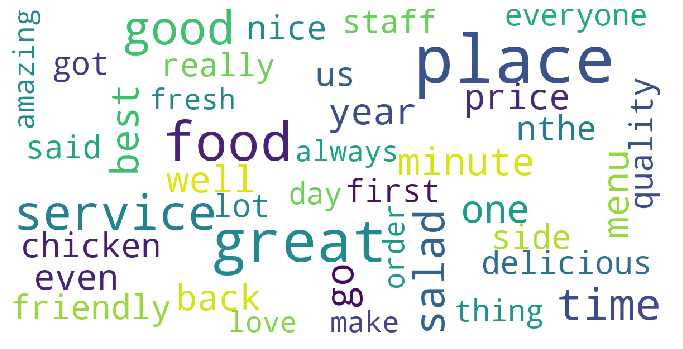

In [187]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=40,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

show_wordcloud(review['text'])
#show_wordcloud(df['categories'])

<xxx> These are simply the most frequent words that appear in all 6.6 million reviews.

### 1.2.2 Word cloud of lower/higer stars 

In [188]:
# lower stars
review['stars_bool'] = review.stars.apply(lambda x: 1 if x >=3.7 else 0)

In [189]:
review_lower_stars = review[review.stars_bool == 0]

In [190]:
review_lower_stars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2283831 entries, 0 to 6685901
Data columns (total 14 columns):
Unnamed: 0        object
business_id       object
cool              object
date              object
funny             int64
review_id         object
stars             float64
text              object
useful            float64
user_id           object
negative_words    float64
positive_words    float64
stop_words        float64
stars_bool        int64
dtypes: float64(5), int64(2), object(7)
memory usage: 261.4+ MB


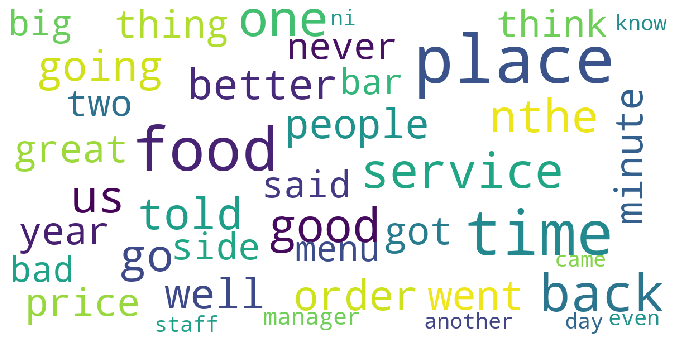

In [191]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=40,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

show_wordcloud(review_lower_stars['text'])
#show_wordcloud(df['categories'])

Over here, we have narrowed a subset of the reviews where the rating is below approximately 3.7 stars. For now, we'll categorize any rating below that threshold as negative, and anything above that as positive. (Since this is the average)

Above are the most frequent words that appear in negatively-rated reviews. Just from eyeballing the visual, we can see that a few negative buzzwords appear. For now, this gives us a good high level understanding of how reviewers use language in negative ratings.

In [192]:
# higher stars
review_higher_stars = review[review.stars_bool == 1]

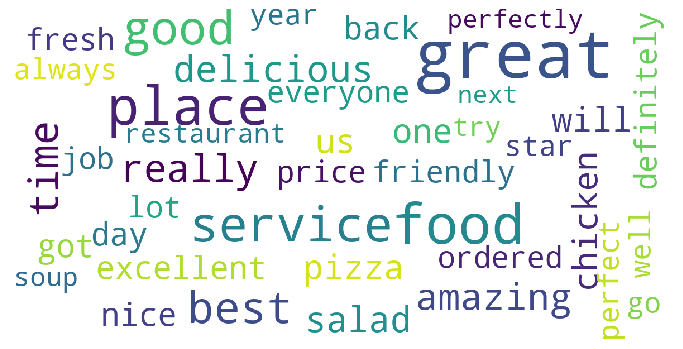

In [193]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=40,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

show_wordcloud(review_higher_stars['text'])
#show_wordcloud(df['categories'])

<xxx> Similarly, we did the same high-level analysis with positive reviews. Again, this gives us a good high-level understanding of how positive reviews work. These insights will be very helpful later on when we peform a sentiment analysis on our reviews.

# <u> 2 Data Cleaning </u>

## <u> 2.1 Business dataset </u>

### 2.1.1 Get Dummy of Attributes

The biggest problem for this business dataset is the attributes which are consisted of the nested dictionary. The attributes include some important information we want to know how they can affect the business such as Price range, Parking choice, and Paying choice, etc. We write two functions, one to detect one-layer dictionaries then convert them to individual columns, and another function to unpack two-layers dictionaries then convert them to columns without hierarchy. 

In [21]:
business.attributes[1]

{'RestaurantsReservations': 'True',
 'GoodForMeal': "{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}",
 'BusinessParking': "{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}",
 'Caters': 'True',
 'NoiseLevel': "u'loud'",
 'RestaurantsTableService': 'True',
 'RestaurantsTakeOut': 'True',
 'RestaurantsPriceRange2': '2',
 'OutdoorSeating': 'False',
 'BikeParking': 'False',
 'Ambience': "{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}",
 'HasTV': 'False',
 'WiFi': "u'no'",
 'GoodForKids': 'True',
 'Alcohol': "u'full_bar'",
 'RestaurantsAttire': "u'casual'",
 'RestaurantsGoodForGroups': 'True',
 'RestaurantsDelivery': 'False'}

In [22]:
import ast

In [23]:
attributes_set_1layer = set()
attributes_set_2layer_key = set()
attributes_set_2layer_values = set()


for dicti in business.attributes:
    if dicti!=None:
        for k,v in dicti.items():
            if v!="None":
                if v[0]!="{":
                    attributes_set_1layer.add(k)
                else:
                    attributes_set_2layer_key.add(k)
                    layer2_dict = ast.literal_eval(v)
                    for k_2 in layer2_dict.keys():
                        attributes_set_2layer_values.add(k+"."+k_2)

In [24]:
def find_1layer(dicti, key):
    if dicti!=None:
        if dicti.get(key)!=None:
            if dicti[key]!='None':
                return(dicti[key])
    return(None)
for col in attributes_set_1layer:
    business[col] = business.attributes.apply(lambda x: find_1layer(x,col))


In [25]:
def unpack_2layer(dicti, key1, key2):
    if dicti!=None:
        if dicti.get(key1)!=None:
            if dicti[key1]!='None':
                dicti_2 = ast.literal_eval(dicti[key1])
                if dicti_2.get(key2)!=None:
                    return(dicti_2.get(key2))
    return(None)

In [26]:
for ind in business.index:
    dicti = business.attributes[ind]
    for key12 in attributes_set_2layer_values:
        key12_list = key12.split(".")
        key1 = key12_list[0]
        key2 = key12_list[1]
        
        value = unpack_2layer(dicti, key1, key2)
        if type(value) == bool:
            value = value*1
        business.at[ind, key12] = value

In [27]:
business.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,Alcohol,BYOB,BikeParking,WiFi,OutdoorSeating,NoiseLevel,Open24Hours,BusinessAcceptsCreditCards,ByAppointmentOnly,RestaurantsDelivery,RestaurantsTableService,RestaurantsPriceRange2,RestaurantsReservations,Corkage,CoatCheck,GoodForKids,WheelchairAccessible,GoodForDancing,Smoking,BYOBCorkage,BusinessAcceptsBitcoin,AgesAllowed,AcceptsInsurance,DogsAllowed,HappyHour,DriveThru,HasTV,Caters,RestaurantsCounterService,RestaurantsAttire,RestaurantsGoodForGroups,RestaurantsTakeOut,Ambience.upscale,DietaryRestrictions.vegetarian,Ambience.hipster,GoodForMeal.dessert,Ambience.trendy,BestNights.wednesday,BestNights.monday,BestNights.thursday,Music.video,BestNights.saturday,Music.jukebox,GoodForMeal.breakfast,DietaryRestrictions.gluten-free,DietaryRestrictions.kosher,Ambience.divey,Music.dj,DietaryRestrictions.vegan,HairSpecializesIn.kids,Ambience.intimate,Ambience.casual,BestNights.tuesday,Music.live,Music.karaoke,GoodForMeal.latenight,BestNights.friday,HairSpecializesIn.curly,DietaryRestrictions.soy-free,DietaryRestrictions.halal,HairSpecializesIn.straightperms,GoodForMeal.brunch,HairSpecializesIn.extensions,BestNights.sunday,HairSpecializesIn.coloring,Ambience.touristy,Music.background_music,BusinessParking.lot,GoodForMeal.lunch,GoodForMeal.dinner,BusinessParking.street,DietaryRestrictions.dairy-free,HairSpecializesIn.perms,BusinessParking.validated,Ambience.romantic,BusinessParking.garage,Ambience.classy,HairSpecializesIn.africanamerican,Music.no_music,HairSpecializesIn.asian,BusinessParking.valet
0,2818 E Camino Acequia Drive,{'GoodForKids': 'False'},1SWheh84yJXfytovILXOAQ,"Golf, Active Life",Phoenix,None,0,33.522143,-112.018481,Arizona Biltmore Golf Club,85016,5,3.0,AZ,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,False,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMe...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported...",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON,u'full_bar',None,False,u'no',False,u'loud',None,None,None,False,True,2,True,None,None,True,None,None,None,None,None,None,None,None,None,None,False,True,None,u'casual',True,True,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,1.0,1.0,1.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0
2,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC,u'beer_and_wine',None,True,u'no',False,u'average',None,True,None,False,True,2,True,None,None,True,None,None,None,None,None,None,None,None,None,None,True,False,None,'casual',True,True,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,1.0,1.0,1.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0
3,"15655 W Roosevelt St, Ste 237",None,xvX2CttrVhyG2z1dFg_0xw,"Insurance, Financial Services",Goodyear,"{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ...",1,33.455613,-112.395596,Farmers Insurance - Paul Lorenz,85338,3,5.0,AZ,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [28]:
len(business.columns)

95

### 2.1.2 Calculate weekly_total_hours based on hours column

The hours column in business data frame is made by string with the information of opening hours per each day of a week. We created a function to calculate the total opening hours per week for each store.

In [29]:
def get_total_time(time_dict):
    
    if time_dict == None:
        return(None)
    
    if time_dict == "None":
        return(None)
    
    total_time = 0
    for k,v in time_dict.items():
        time_list = v.split("-")
        time1 = time_list[0]
        time2 = time_list[1]
        time1 = time1.split(":")
        time2 = time2.split(":")
        
        time1_hour = float(time1[0])
        time1_min = float(time1[1])
        time2_hour = float(time2[0])
        time2_min = float(time2[1])
        if time2_hour < time1_hour:
            time2_hour += 24
        
        #print(time2_hour , time1_hour , time2_min , time1_min)
        oneday_time = time2_hour - time1_hour + (time2_min - time1_min)/60
        total_time += oneday_time
        
    return(total_time)

In [30]:
business["weekly_total_hours"] = business.hours.apply(get_total_time)

In [31]:
business.weekly_total_hours.head()

0      NaN
1    107.0
2     24.5
3     45.0
4    112.0
Name: weekly_total_hours, dtype: float64

In [32]:
len(business.columns)

96

### 2.1.3 Drop useless columns 

Drop the columns have too many NaN with the threshold of half number of rows

In [33]:
t = len(business)/2
business.dropna(thresh=t, axis=1, inplace=True)

Replace True and False to 1 and 0

In [34]:
business.replace("True",1,inplace=True)

In [35]:
business.replace("False",0,inplace=True)

In [36]:
business.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,BusinessAcceptsCreditCards,RestaurantsPriceRange2,BusinessParking.lot,BusinessParking.street,BusinessParking.validated,BusinessParking.garage,BusinessParking.valet,weekly_total_hours
0,2818 E Camino Acequia Drive,{'GoodForKids': 'False'},1SWheh84yJXfytovILXOAQ,"Golf, Active Life",Phoenix,None,0,33.522143,-112.018481,Arizona Biltmore Golf Club,85016,5,3.0,AZ,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMe...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported...",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON,NaN,2,1.0,0.0,0.0,0.0,0.0,107.0
2,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC,1.0,2,1.0,0.0,0.0,0.0,0.0,24.5
3,"15655 W Roosevelt St, Ste 237",None,xvX2CttrVhyG2z1dFg_0xw,"Insurance, Financial Services",Goodyear,"{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ...",1,33.455613,-112.395596,Farmers Insurance - Paul Lorenz,85338,3,5.0,AZ,NaN,None,NaN,NaN,NaN,NaN,NaN,45.0
4,"4209 Stuart Andrew Blvd, Ste F","{'BusinessAcceptsBitcoin': 'False', 'ByAppoint...",HhyxOkGAM07SRYtlQ4wMFQ,"Plumbing, Shopping, Local Services, Home Servi...",Charlotte,"{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",1,35.190012,-80.887223,Queen City Plumbing,28217,4,4.0,NC,1.0,None,NaN,NaN,NaN,NaN,NaN,112.0


In [37]:
len(business.columns)

22

### 2.1.4 Calculate total parking point using Businees-parking columns

There are different ways of business parking on different columns. To make the dataframe more net, we calculate the the total parking points based on different ways of parking, then delete the original columns. 

In [38]:
df_parking = business[['BusinessParking.valet','BusinessParking.lot',\
                   'BusinessParking.street','BusinessParking.garage','BusinessParking.validated']]
business['parking_point'] = df_parking.sum(axis = 1, skipna = True) 

In [39]:
business.parking_point.head()

0    0.0
1    1.0
2    1.0
3    0.0
4    0.0
Name: parking_point, dtype: float64

In [40]:
business.drop(columns=['BusinessParking.valet','BusinessParking.lot',\
                   'BusinessParking.street','BusinessParking.garage','BusinessParking.validated'],inplace=True)

In [41]:
len(business.columns)

18

### 2.1.5 Convert RestaurantsPriceRange2 from string to int 1 and 0

We also found values of RestaurantsPriceRange2 should be integer instead of strings.

In [42]:
business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192609 entries, 0 to 192608
Data columns (total 18 columns):
address                       192609 non-null object
attributes                    163773 non-null object
business_id                   192609 non-null object
categories                    192127 non-null object
city                          192609 non-null object
hours                         147779 non-null object
is_open                       192609 non-null int64
latitude                      192609 non-null float64
longitude                     192609 non-null float64
name                          192609 non-null object
postal_code                   192609 non-null object
review_count                  192609 non-null int64
stars                         192609 non-null float64
state                         192609 non-null object
BusinessAcceptsCreditCards    113019 non-null float64
RestaurantsPriceRange2        108082 non-null object
weekly_total_hours            147779 no

In [43]:
business['RestaurantsPriceRange2'] = business.RestaurantsPriceRange2.apply(lambda x: None if x == None else int(x))

### 2.1.6 caculate boolean of stars 

To prepare for Machine Learning modeling, we calculate the boolean of stars, 1 represent for higher level of stars and 0 for lower level of stars, based on 3.7 the average stars level of total dataframe.

In [44]:
business.stars.mean()

3.585626839867296

In [45]:
business['stars_bool'] = business.stars.apply(lambda x: 1 if x >= 3.7 else 0)

### 2.1.7 Drop NaN 

In [46]:
orginal_business = business.copy()

business.dropna(inplace=True)

In [47]:
business.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58209 entries, 2 to 192607
Data columns (total 19 columns):
address                       58209 non-null object
attributes                    58209 non-null object
business_id                   58209 non-null object
categories                    58209 non-null object
city                          58209 non-null object
hours                         58209 non-null object
is_open                       58209 non-null int64
latitude                      58209 non-null float64
longitude                     58209 non-null float64
name                          58209 non-null object
postal_code                   58209 non-null object
review_count                  58209 non-null int64
stars                         58209 non-null float64
state                         58209 non-null object
BusinessAcceptsCreditCards    58209 non-null float64
RestaurantsPriceRange2        58209 non-null float64
weekly_total_hours            58209 non-null float64
pa

### 2.1.8 Reset index 

In [48]:
business.reset_index(inplace=True)

In [49]:
business.drop(columns='index',inplace=True)


In [50]:
len(business)
len(business.columns)

58209

19

In [51]:
# final business data
business.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,BusinessAcceptsCreditCards,RestaurantsPriceRange2,weekly_total_hours,parking_point,stars_bool
0,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC,1.0,2.0,24.5,1.0,1
1,"4545 E Tropicana Rd Ste 8, Tropicana","{'RestaurantsPriceRange2': '3', 'GoodForKids':...",gbQN7vr_caG_A1ugSmGhWg,"Hair Salons, Hair Stylists, Barbers, Men's Hai...",Las Vegas,"{'Monday': '10:0-19:0', 'Tuesday': '10:0-19:0'...",1,36.099872,-115.074574,Supercuts,89121,3,3.5,NV,1.0,3.0,62.0,0.0,0
2,5940 W Union Hills Dr,"{'RestaurantsPriceRange2': '2', 'ByAppointment...",Y6iyemLX_oylRpnr38vgMA,"Nail Salons, Beauty & Spas, Day Spas",Glendale,"{'Tuesday': '12:0-18:0', 'Wednesday': '10:0-18...",0,33.654815,-112.188568,Vita Bella Fine Day Spa,85308,8,5.0,AZ,1.0,2.0,31.0,1.0,1
3,21689 Lorain Rd,"{'ByAppointmentOnly': 'False', 'BusinessAccept...",4GBVPIYRvzGh4K4TkRQ_rw,"Beauty & Spas, Nail Salons, Day Spas, Massage",Fairview Park,"{'Tuesday': '9:0-21:0', 'Wednesday': '9:0-21:0...",1,41.440825,-81.854097,Options Salon & Spa,44126,8,4.5,OH,1.0,2.0,53.0,1.0,1
4,2450 E Indian School Rd,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...",1Dfx3zM-rW4n-31KeC8sJg,"Restaurants, Breakfast & Brunch, Mexican, Taco...",Phoenix,"{'Monday': '7:0-0:0', 'Tuesday': '7:0-0:0', 'W...",1,33.495194,-112.028588,Taco Bell,85016,18,3.0,AZ,1.0,1.0,122.0,0.0,0


After cleaning, we have 58209 rows and 19 columns for the business dataset. 

### 2.1.9 Create the dataframe based on categories 

since we also want to see how the business differ in various categories, we made another dataframe based on business dataset.

In [52]:
business_cat = business.copy()

In [53]:
# break the category into the list
def split_categories(x):
    if x!=None:
        cat_list =[" ".join(cat.split()) for cat in x.split(",")]
        return(cat_list)
    else:
        return([])
    
business_cat["categories_list"] = business_cat.categories.apply(split_categories)

In [54]:
# unpack the list
s = business_cat.apply(lambda x: pd.Series(x['categories_list']),axis=1).stack().reset_index(level=1, drop=True)
s.head()

0       Sushi Bars
0      Restaurants
0         Japanese
1      Hair Salons
1    Hair Stylists
dtype: object

In [55]:
s.name = 'category'
business_cat = business_cat.join(s)

In [56]:
business_cat.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,BusinessAcceptsCreditCards,RestaurantsPriceRange2,weekly_total_hours,parking_point,stars_bool,categories_list,category
0,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC,1.0,2.0,24.5,1.0,1,"[Sushi Bars, Restaurants, Japanese]",Sushi Bars
0,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC,1.0,2.0,24.5,1.0,1,"[Sushi Bars, Restaurants, Japanese]",Restaurants
0,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC,1.0,2.0,24.5,1.0,1,"[Sushi Bars, Restaurants, Japanese]",Japanese
1,"4545 E Tropicana Rd Ste 8, Tropicana","{'RestaurantsPriceRange2': '3', 'GoodForKids':...",gbQN7vr_caG_A1ugSmGhWg,"Hair Salons, Hair Stylists, Barbers, Men's Hai...",Las Vegas,"{'Monday': '10:0-19:0', 'Tuesday': '10:0-19:0'...",1,36.099872,-115.074574,Supercuts,89121,3,3.5,NV,1.0,3.0,62.0,0.0,0,"[Hair Salons, Hair Stylists, Barbers, Men's Ha...",Hair Salons
1,"4545 E Tropicana Rd Ste 8, Tropicana","{'RestaurantsPriceRange2': '3', 'GoodForKids':...",gbQN7vr_caG_A1ugSmGhWg,"Hair Salons, Hair Stylists, Barbers, Men's Hai...",Las Vegas,"{'Monday': '10:0-19:0', 'Tuesday': '10:0-19:0'...",1,36.099872,-115.074574,Supercuts,89121,3,3.5,NV,1.0,3.0,62.0,0.0,0,"[Hair Salons, Hair Stylists, Barbers, Men's Ha...",Hair Stylists


In [57]:
len(business_cat)

276915

In [58]:
business_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 276915 entries, 0 to 58208
Data columns (total 21 columns):
address                       276915 non-null object
attributes                    276915 non-null object
business_id                   276915 non-null object
categories                    276915 non-null object
city                          276915 non-null object
hours                         276915 non-null object
is_open                       276915 non-null int64
latitude                      276915 non-null float64
longitude                     276915 non-null float64
name                          276915 non-null object
postal_code                   276915 non-null object
review_count                  276915 non-null int64
stars                         276915 non-null float64
state                         276915 non-null object
BusinessAcceptsCreditCards    276915 non-null float64
RestaurantsPriceRange2        276915 non-null float64
weekly_total_hours            276915 no

In [59]:
# save it to a new csv file
business_cat.to_csv('yelp_academic_dataset_business_categories')

In [60]:
business_cat.groupby("category")["category"].count().nlargest(10)
top_cat = business_cat.groupby("category")["category"].count().nlargest(10)

category
Restaurants               26214
Shopping                  15527
Food                      14258
Beauty & Spas             10245
Nightlife                  6814
Bars                       6197
American (Traditional)     4809
Sandwiches                 3969
Fashion                    3957
Hair Salons                3809
Name: category, dtype: int64

In [61]:
top_catdf=pd.DataFrame(top_cat)

In [62]:
top_catdf['id']=list(top_catdf.index)

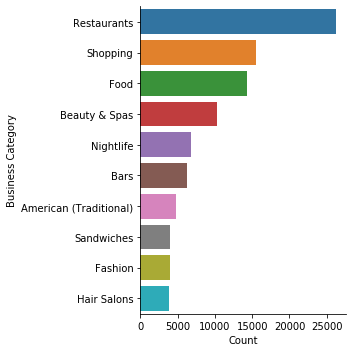

In [65]:
import seaborn as sns
sns.factorplot(x='category',y='id',data=top_catdf,kind='bar').set(xlabel='Count',ylabel='Business Category')
#improved category graph???

## <u> 2.2 Review Dataset

Review dataset is made of 6.6 million of rows of long-paragraph text data. We calclculated the negative, positive and stopwords for the text in each rows. The whole cleaning process cost a huge amount of memory and time. We copied the code and result from our original jupyter file, where we did all the cleaning process and save the result to a csv file. So you can see thet we use this csv file to do following analysis procedures instead of read original json file. We made 'xxxx' sign in this block of code to avoid reruning those code and crushing of our computers. 

In [ ]:
# avoid reruning
xxxx

In [79]:
df_review = pd.read_json('yelp-dataset/yelp_academic_dataset_review.json',lines=True)

In [80]:
pd.set_option('max_colwidth', 800)


In [81]:
df_review.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id
0,ujmEBvifdJM6h6RLv4wQIg,0,2013-05-07 04:34:36,1,Q1sbwvVQXV2734tPgoKj4Q,1,Total bill for this horrible service? Over $8Gs. These crooks actually had the nerve to charge us $69 for 3 pills. I checked online the pills can be had for 19 cents EACH! Avoid Hospital ERs at all costs.,6,hG7b0MtEbXx5QzbzE6C_VA
1,NZnhc2sEQy3RmzKTZnqtwQ,0,2017-01-14 21:30:33,0,GJXCdrto3ASJOqKeVWPi6Q,5,"I *adore* Travis at the Hard Rock's new Kelly Cardenas Salon! I'm always a fan of a great blowout and no stranger to the chains that offer this service; however, Travis has taken the flawless blowout to a whole new level! \n\nTravis's greets you with his perfectly green swoosh in his otherwise perfectly styled black hair and a Vegas-worthy rockstar outfit. Next comes the most relaxing and incredible shampoo -- where you get a full head message that could cure even the very worst migraine in minutes --- and the scented shampoo room. Travis has freakishly strong fingers (in a good way) and use the perfect amount of pressure. That was superb! Then starts the glorious blowout... where not one, not two, but THREE people were involved in doing the best round-brush action my hair has ev...",0,yXQM5uF2jS6es16SJzNHfg
2,WTqjgwHlXbSFevF32_DJVw,0,2016-11-09 20:09:03,0,2TzJjDVDEuAW6MR5Vuc1ug,5,"I have to say that this office really has it together, they are so organized and friendly! Dr. J. Phillipp is a great dentist, very friendly and professional. The dental assistants that helped in my procedure were amazing, Jewel and Bailey helped me to feel comfortable! I don't have dental insurance, but they have this insurance through their office you can purchase for $80 something a year and this gave me 25% off all of my dental work, plus they helped me get signed up for care credit which I knew nothing about before this visit! I highly recommend this office for the nice synergy the whole office has!",3,n6-Gk65cPZL6Uz8qRm3NYw
3,ikCg8xy5JIg_NGPx-MSIDA,0,2018-01-09 20:56:38,0,yi0R0Ugj_xUx_Nek0-_Qig,5,"Went in for a lunch. Steak sandwich was delicious, and the Caesar salad had an absolutely delicious dressing, with a perfect amount of dressing, and distributed perfectly across each leaf. I know I'm going on about the salad ... But it was perfect.\n\nDrink prices were pretty good.\n\nThe Server, Dawn, was friendly and accommodating. Very happy with her.\n\nIn summation, a great pub experience. Would go again!",0,dacAIZ6fTM6mqwW5uxkskg
4,b1b1eb3uo-w561D0ZfCEiQ,0,2018-01-30 23:07:38,0,11a8sVPMUFtaC7_ABRkmtw,1,"Today was my second out of three sessions I had paid for. Although my first session went well, I could tell Meredith had a particular enjoyment for her male clients over her female. However, I returned because she did my teeth fine and I was pleased with the results. When I went in today, I was in the whitening room with three other gentlemen. My appointment started out well, although, being a person who is in the service industry, I always attend to my female clientele first when a couple arrives. Unbothered by those signs, I waited my turn. She checked on me once after my original 30 minute timer to ask if I was ok. She attended my boyfriend on numerous occasions, as well as the other men, and would exit the room without even asking me or looking to see if I had any irritation. Half ...",7,ssoyf2_x0EQMed6fgHeMyQ


In [82]:
# loade positive, negative and stopwords from the files we used for assignment one. 
pos = open('yelp-dataset/positive-words.txt','r')
poscontent = pos.read()
pos.close()

In [83]:
neg = open('yelp-dataset/negative-words.txt','r')
negcontent = neg.read()
neg.close()

In [84]:
stop = open('yelp-dataset/stopwords.txt','r')
stopcontent = stop.read()
stop.close()
#read all the txt files

In [85]:
poslist = poscontent.split('\n')
neglist = negcontent.split('\n')
stoplist=stopcontent.split('\n')  
poslist = poslist[35:] 
neglist = neglist[35:]
stoplist = stoplist[6:]
#split them into a list, deliminated by the newline character....

In [86]:
len(poslist), len(neglist), len(stoplist)

(2007, 4784, 430)

In [87]:
df_review.text[0]  # 1 sample of the text column content (this is the review...)

'Total bill for this horrible service? Over $8Gs. These crooks actually had the nerve to charge us $69 for 3 pills. I checked online the pills can be had for 19 cents EACH! Avoid Hospital ERs at all costs.'

In [21]:
df_review['text'] = df_review.text.str.lower()
#some data cleaning......lower all the text to make sure we're on the same page...

In [72]:
example_sent = df_review.text[0]
example_sent
#it works....

'total bill for this horrible service? over $8gs. these crooks actually had the nerve to charge us $69 for 3 pills. i checked online the pills can be had for 19 cents each! avoid hospital ers at all costs.'

In [73]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/qiuguo/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [74]:
from nltk.tokenize import word_tokenize
word_tokens = word_tokenize(example_sent)
len([w for w in word_tokens if w in poslist])

0

In [75]:
%%timeit
word_tokens = word_tokenize(example_sent)
len([w for w in word_tokens if w in poslist])
len([w for w in word_tokens if w in neglist])
len([w for w in word_tokens if w in stoplist])

2.75 ms ± 112 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [76]:
word_tokens = word_tokenize(example_sent)
len([w for w in word_tokens if w in poslist]),len([w for w in word_tokens if w in neglist]),len([w for w in word_tokens if w in stoplist])

(0, 2, 18)

In [77]:
poslist = set(poslist)
neglist = set(neglist)
stoplist = set(stoplist)

In [78]:
%%timeit
word_tokens = word_tokenize(example_sent)
len([w for w in word_tokens if w in poslist])
len([w for w in word_tokens if w in neglist])
len([w for w in word_tokens if w in stoplist])

346 µs ± 15.9 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [40]:
def find_num(example_sent, words_set):
    word_tokens = word_tokenize(example_sent)
    n = len([w for w in word_tokens if w in words_set])
    return(n)

In [79]:
%%time
df_review["negative_words"] = df_review.text.apply(lambda x: find_num(x, neglist))

CPU times: user 1h 14min 5s, sys: 6.84 s, total: 1h 14min 12s
Wall time: 1h 14min 32s


In [80]:
%%time
df_review["positive_words"] = df_review.text.apply(lambda x: find_num(x, poslist))

CPU times: user 1h 13min 56s, sys: 4.31 s, total: 1h 14min 1s
Wall time: 1h 14min 16s


In [81]:
%%time
df_review["stop_words"] = df_review.text.apply(lambda x: find_num(x, stoplist))

CPU times: user 1h 15min 40s, sys: 5.22 s, total: 1h 15min 45s
Wall time: 1h 15min 55s


In [82]:
df_review.to_csv("yelp_academic_dataset_review_SentimentAttached.csv")

In [ ]:
xxxx

# <u> 3 Three Intersting Findings </u>

**Our 3 Main Findings:**
* Insight into survival rates of various establishments
* Insight into the relationship between business hours and rating (Machine Learning + Managerial Findings)
* Insight gained from performing sentiment analysis on each review (Optimizing Algorithms + Technology Findings)

## <u> 3.1  Finding One <u>

<xxx> Explain 

In [292]:
# break the category into the list
business_cat_31 = orginal_business.copy()

def split_categories(x):
    if x!=None:
        cat_list =[" ".join(cat.split()) for cat in x.split(",")]
        return(cat_list)
    else:
        return([])
business_cat_31["categories_list"] = business_cat_31.categories.apply(split_categories)
s = business_cat_31.apply(lambda x: pd.Series(x['categories_list']),axis=1).stack().reset_index(level=1, drop=True)
s.head()
s.name = 'category'
business_cat_31 = business_cat_31.join(s)
business_cat_31.head()

0              Golf
0       Active Life
1    Specialty Food
1       Restaurants
1           Dim Sum
dtype: object

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,BusinessAcceptsCreditCards,RestaurantsPriceRange2,weekly_total_hours,parking_point,stars_bool,categories_list,category
0,2818 E Camino Acequia Drive,{'GoodForKids': 'False'},1SWheh84yJXfytovILXOAQ,"Golf, Active Life",Phoenix,None,0,33.522143,-112.018481,Arizona Biltmore Golf Club,85016,5,3.0,AZ,NaN,NaN,NaN,0.0,0,"[Golf, Active Life]",Golf
0,2818 E Camino Acequia Drive,{'GoodForKids': 'False'},1SWheh84yJXfytovILXOAQ,"Golf, Active Life",Phoenix,None,0,33.522143,-112.018481,Arizona Biltmore Golf Club,85016,5,3.0,AZ,NaN,NaN,NaN,0.0,0,"[Golf, Active Life]",Active Life
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMeal': '{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}', 'BusinessParking': '{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}', 'Caters': 'True', 'NoiseLevel': 'u'loud'', 'RestaurantsTableService': 'True', 'RestaurantsTakeOut': 'True', 'RestaurantsPriceRange2': '2', 'OutdoorSeating': 'False', 'BikeParking': 'False', 'Ambience': '{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}', 'HasTV': 'False', 'WiFi': 'u'no'', 'GoodForKids': 'True', 'Alcohol': 'u'full_bar'', 'RestaurantsAttire': 'u'casual'', 'RestaurantsGoodForGroups': 'True', 'Restauran...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'Wednesday': '9:0-0:0', 'Thursday': '9:0-0:0', 'Friday': '9:0-1:0', 'Saturday': '9:0-1:0', 'Sunday': '9:0-0:0'}",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON,NaN,2.0,107.0,1.0,0,"[Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood]",Specialty Food
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMeal': '{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}', 'BusinessParking': '{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}', 'Caters': 'True', 'NoiseLevel': 'u'loud'', 'RestaurantsTableService': 'True', 'RestaurantsTakeOut': 'True', 'RestaurantsPriceRange2': '2', 'OutdoorSeating': 'False', 'BikeParking': 'False', 'Ambience': '{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}', 'HasTV': 'False', 'WiFi': 'u'no'', 'GoodForKids': 'True', 'Alcohol': 'u'full_bar'', 'RestaurantsAttire': 'u'casual'', 'RestaurantsGoodForGroups': 'True', 'Restauran...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'Wednesday': '9:0-0:0', 'Thursday': '9:0-0:0', 'Friday': '9:0-1:0', 'Saturday': '9:0-1:0', 'Sunday': '9:0-0:0'}",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON,NaN,2.0,107.0,1.0,0,"[Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood]",Restaurants
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMeal': '{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}', 'BusinessParking': '{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}', 'Caters': 'True', 'NoiseLevel': 'u'loud'', 'RestaurantsTableService': 'True', 'RestaurantsTakeOut': 'True', 'RestaurantsPriceRange2': '2', 'OutdoorSeating': 'False', 'BikeParking': 'False', 'Ambience': '{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}', 'HasTV': 'False', 'WiFi': 'u'no'', 'GoodFo

In [331]:
gb_b_cat = business_cat_31.groupby(["category"]).agg({'is_open': ['count', 'sum', 'mean']})
gb_b_cat.columns = ["Count", "survive", "survive_rate"]
gb_b_cat = gb_b_cat.sort_values(by=['Count'], ascending=False)
gb_b_cat = gb_b_cat.reset_index()
gb_b_cat.head()

,category,Count,survive,survive_rate
0,Restaurants,59371,42237,0.711408
1,Shopping,31878,26734,0.838635
2,Food,29989,23208,0.773884
3,Home Services,19729,18455,0.935425
4,Beauty & Spas,19370,16545,0.854156


###  <u> 3.1.0 Top catergories </u>

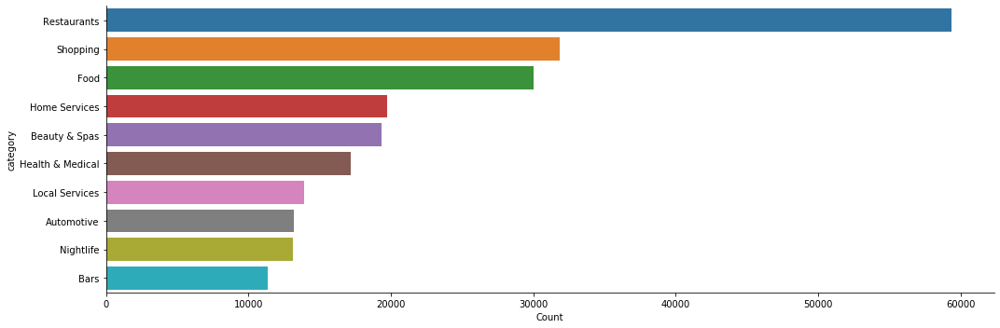

In [333]:
sns.factorplot(y='category',x='Count',data=gb_b_cat.head(10),kind='bar',aspect=3)
#plt.ylim([0.5,1])

###  <u>3.1.1 what category are easier to survive</u>

count more than 100, what business is hard to surivive

(0.4, 0.7)

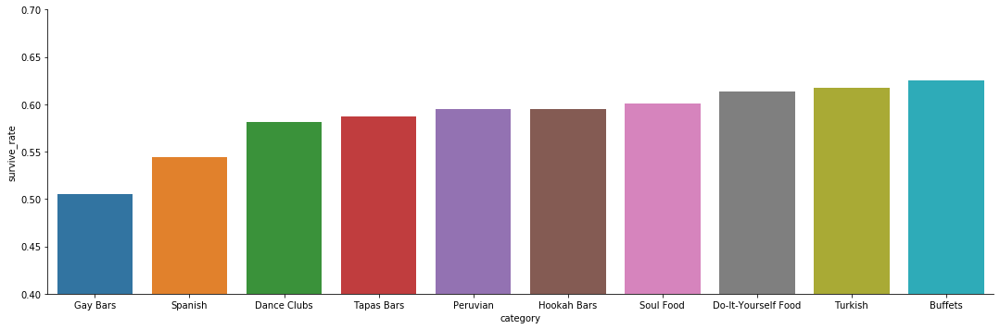

In [226]:
gb_b_cat = gb_b_cat.sort_values(by="survive_rate")

sns.factorplot(y='survive_rate',x='category',data=gb_b_cat.loc[gb_b_cat.Count >= 100].head(10),kind='bar',aspect=3)
plt.ylim([0.4,.7])

count more than 100, what business is easy to surivive

(0.5, 0.1)

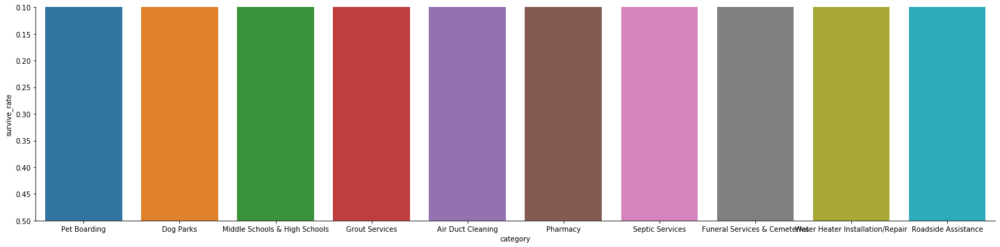

In [297]:
gb_b_cat = gb_b_cat.sort_values(by="survive_rate", ascending=False)

sns.factorplot(y='survive_rate',x='category',data=gb_b_cat.loc[gb_b_cat.Count >= 100].head(10),kind='bar',aspect=4)
plt.ylim([0.5,.1])

###  <u>3.1.2 Survive rate compare with catergories vs stars </u>

In [224]:
top_cat = business_cat_31.category.value_counts()[:20].index

In [225]:
groupby_sr=business_cat_31.loc[business_cat_31.category.isin(top_cat)].groupby(['category','stars'])['is_open'].mean()


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7feeb7a95a90>)

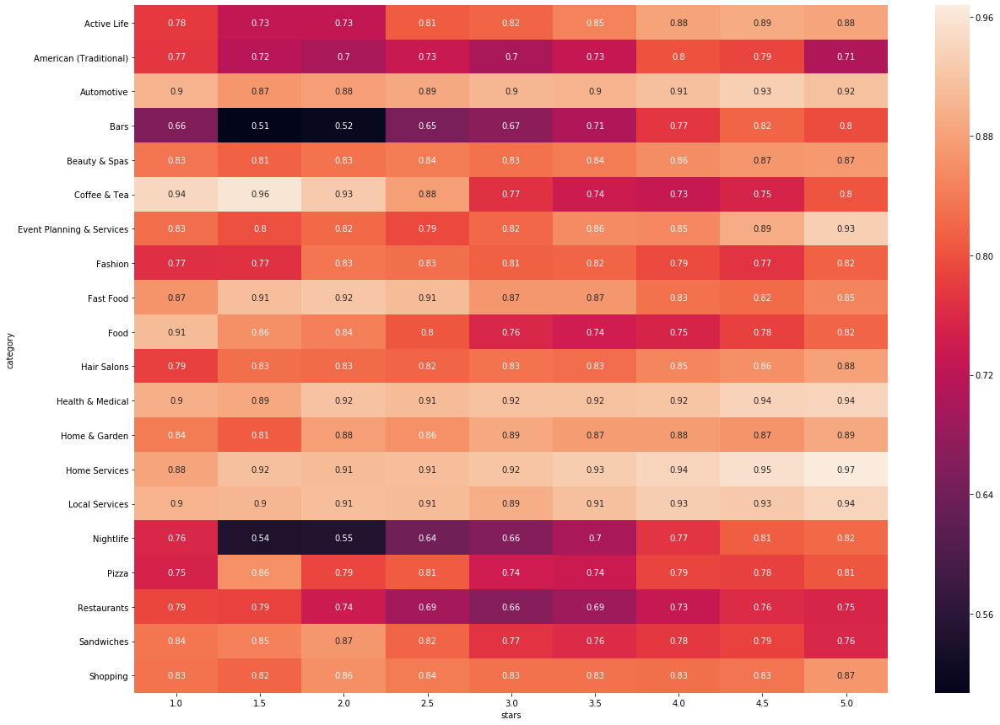

In [228]:
plt.subplots(figsize=(20,15))
sns.heatmap(groupby_sr.unstack(),annot=True)


- When looking at survival rate: 
    - Health andMedical, Local Survice, Shopping are not sensitive to reviews stars. They all have very high survial rate
    - Bar, activity life, night life have a better survival rate when the review stars is high

###  <u>3.1.3 Survive rate compare with price </u>

In [229]:
business_cat_32.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,categories_list,category
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMeal': '{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}', 'BusinessParking': '{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}', 'Caters': 'True', 'NoiseLevel': 'u'loud'', 'RestaurantsTableService': 'True', 'RestaurantsTakeOut': 'True', 'RestaurantsPriceRange2': '2', 'OutdoorSeating': 'False', 'BikeParking': 'False', 'Ambience': '{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}', 'HasTV': 'False', 'WiFi': 'u'no'', 'GoodForKids': 'True', 'Alcohol': 'u'full_bar'', 'RestaurantsAttire': 'u'casual'', 'RestaurantsGoodForGroups': 'True', 'Restauran...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'Wednesday': '9:0-0:0', 'Thursday': '9:0-0:0', 'Friday': '9:0-1:0', 'Saturday': '9:0-1:0', 'Sunday': '9:0-0:0'}",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON,"[Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood]",Specialty Food
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMeal': '{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}', 'BusinessParking': '{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}', 'Caters': 'True', 'NoiseLevel': 'u'loud'', 'RestaurantsTableService': 'True', 'RestaurantsTakeOut': 'True', 'RestaurantsPriceRange2': '2', 'OutdoorSeating': 'False', 'BikeParking': 'False', 'Ambience': '{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}', 'HasTV': 'False', 'WiFi': 'u'no'', 'GoodForKids': 'True', 'Alcohol': 'u'full_bar'', 'RestaurantsAttire': 'u'casual'', 'RestaurantsGoodForGroups': 'True', 'Restauran...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'Wednesday': '9:0-0:0', 'Thursday': '9:0-0:0', 'Friday': '9:0-1:0', 'Saturday': '9:0-1:0', 'Sunday': '9:0-0:0'}",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON,"[Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood]",Restaurants
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMeal': '{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}', 'BusinessParking': '{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}', 'Caters': 'True', 'NoiseLevel': 'u'loud'', 'RestaurantsTableService': 'True', 'RestaurantsTakeOut': 'True', 'RestaurantsPriceRange2': '2', 'OutdoorSeating': 'False', 'BikeParking': 'False', 'Ambience': '{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}', 'HasTV': 'False', 'WiFi': 'u'no'', 'GoodForKids': 'True', 'Alcohol': 'u'full_bar'', 'RestaurantsAttire': 'u'casual'', 'RestaurantsGoodForGroups': 'True', 'Restauran...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'Wednesday': '9:0-0:0', 'Thursday': '9:0-0:0', 'Friday': '9:0-1:0', 'Saturday': '9:0-1:0', 'Sunday': '9:0-0:0'}",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON,"[Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood]",Dim Sum
1,30

In [230]:
business_cat_32 = business_cat_31.dropna()
groupby_sr2 = business_cat_32.groupby(['RestaurantsPriceRange2','stars'])['is_open'].mean()

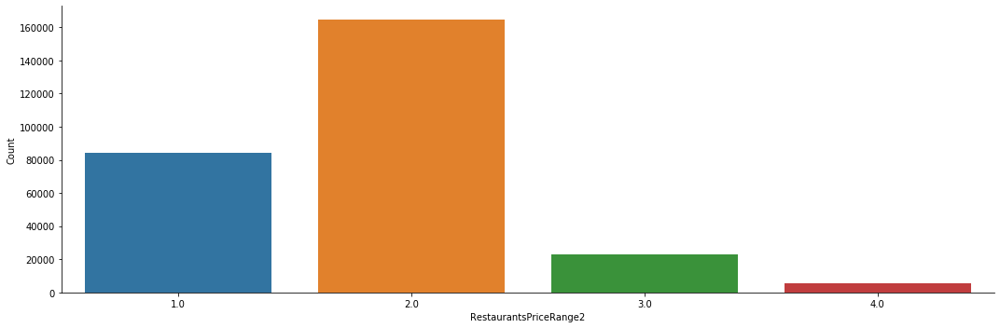

In [249]:
price_gb = pd.DataFrame(business_cat_32.RestaurantsPriceRange2.value_counts()).reset_index()
price_gb.columns = ["RestaurantsPriceRange2", "Count"]
price_gb = price_gb.sort_values(by="RestaurantsPriceRange2", ascending=False)
#price_gb['RestaurantsPriceRange2'] = price_gb['RestaurantsPriceRange2'].apply(str)
sns.factorplot(x='RestaurantsPriceRange2',y='Count',data=price_gb,kind='bar',aspect=3)


(<Figure size 720x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7feed2fae4e0>)

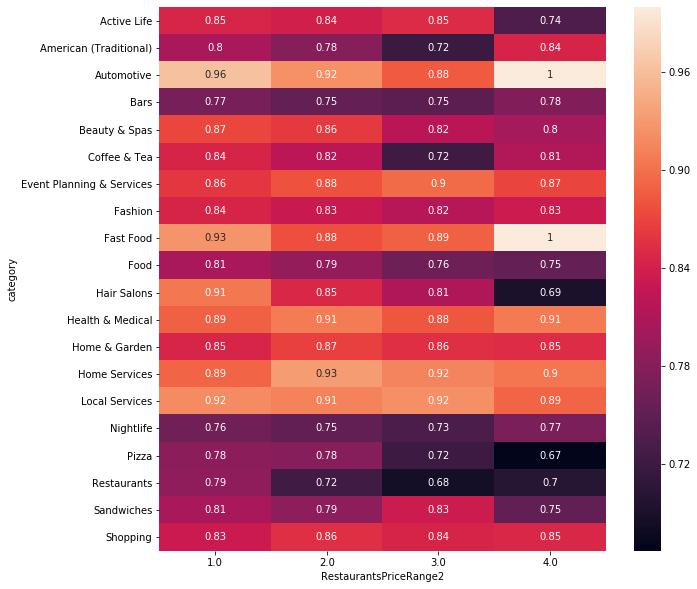

In [254]:
groupby_sr4=business_cat_32.loc[business_cat_32.category.isin(top_cat) ].\
groupby(['category','RestaurantsPriceRange2'])['is_open'].mean()
plt.subplots(figsize=(10,10))

sns.heatmap(groupby_sr4.unstack(),annot=True)

- When looking at survival rate: 
    - Health and Medical, Local Survice, Shopping are not sensitive to price. They all have very high survial rate
    - Activity life, Hair Salon, Pizza have a low survival rate when the price is high

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fede123cbe0>)

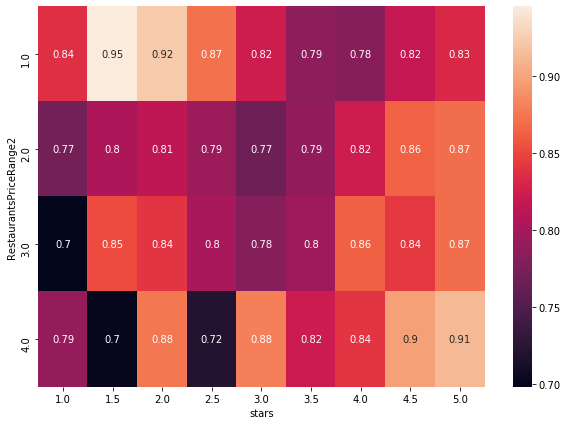

In [231]:
plt.subplots(figsize=(10,7))

sns.heatmap(groupby_sr2.unstack(),annot=True)

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fed35479358>)

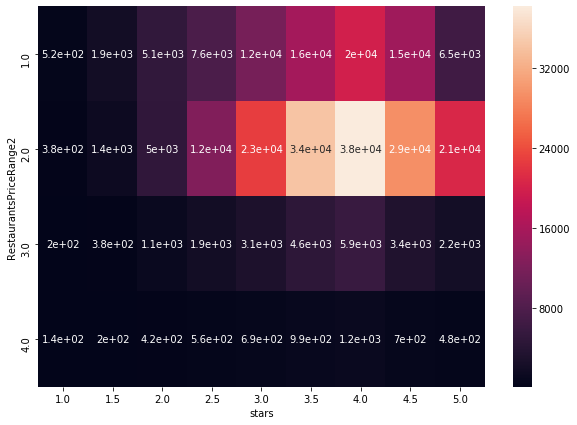

In [251]:
groupby_sr3=business_cat_32.groupby(['RestaurantsPriceRange2','stars'])['is_open'].count()
plt.subplots(figsize=(10,7))

sns.heatmap(groupby_sr3.unstack(),annot=True)

In [285]:
business_p1_Star_low=business_cat_32.loc[(business_cat_32.stars<=2.5) &( business_cat_32.RestaurantsPriceRange2==1)]#.loc[business_sub.RestaurantsPriceRange2=='1']
business_p1_Star_high=business_cat_32.loc[(business_cat_32.stars>2.5) &( business_cat_32.RestaurantsPriceRange2==1)]#.loc[business_sub.RestaurantsPriceRange2=='1']

#.loc[business_sub.category.i

In [286]:
top_index_5 = business_p1_Star_low.category.value_counts()[:20].index
business_p1_Star_low.category.value_counts()[:20]

Restaurants               2458
Fast Food                 1551
Food                      1283
Burgers                    791
Coffee & Tea               618
Shopping                   450
Mexican                    390
Sandwiches                 382
American (Traditional)     350
Chicken Wings              293
Breakfast & Brunch         271
Pizza                      271
Beauty & Spas              189
Fashion                    187
Convenience Stores         181
Grocery                    176
Tex-Mex                    172
Chinese                    171
Discount Store             159
Drugstores                 156
Name: category, dtype: int64

(<Figure size 720x360 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fee21196860>)

Text(0.5, 1.0, 'Stars lower and equal to 2.5')

(<Figure size 720x360 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fed91a065c0>)

Text(0.5, 1.0, 'Stars higer than 2.5')

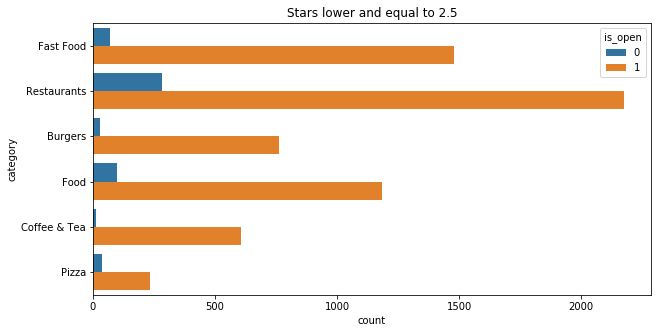

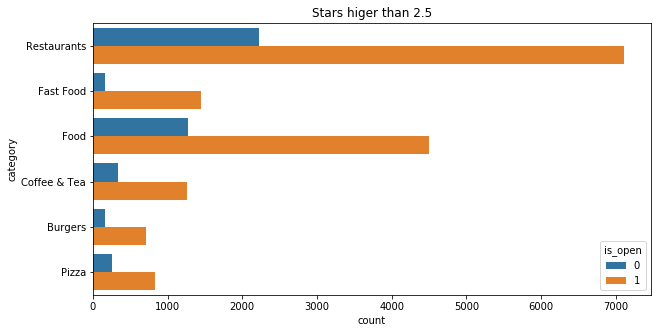

In [287]:
specific_groups = ["Restaurants", "Fast Food", "Food", "Burgers", "Coffee & Tea", "Pizza"]
#specific_groups = top_index_5
plt.subplots(figsize=(10,5))
sns.countplot(y="category", hue="is_open", data=business_p1_Star_low.loc[business_p1_Star_low.category.isin(specific_groups)])
plt.title("Stars lower and equal to 2.5")
plt.subplots(figsize=(10,5))

sns.countplot(y="category", hue="is_open", data=business_p1_Star_high.loc[business_p1_Star_high.category.isin(specific_groups)])
plt.title("Stars higer than 2.5")

In [288]:
print("The number of low price and low stars business is ",len(business_p1_Star_low))
print("The number of low price and high stars business is ",  len(business_p1_Star_high))

The number of low price and low stars business is  15121
The number of low price and high stars business is  68977


In [289]:
print("Survival rate for low price and low stars businesses is ", np.mean(business_p1_Star_low.is_open))
print("Survival rate for low price and high stars businesses is ", np.mean(business_p1_Star_high.is_open))

Survival rate for low price and low stars businesses is  0.8974274188215066
Survival rate for low price and high stars businesses is  0.8030647897125128


- The difference in the above 2 survival rate is consistant with our findings above
- We wants to validate if this difference is significant through an A/B test
    - Sampled 15121 records from 68977 low price and high stars business
    - Calculate survial rate 
    - Repeated the sampling process 1000 times and stored 1000 survial rates
    - Plot the histogram of the 1000 sampled survival rate from low price and high stars business
    - Compare the actual surcial rate from low price and low stars business 0.8974274188215066
-  We can see that the actual surcial rate from low price and low stars business is much higher than the sampled survival rate from low price and high stars business
- The difference that we observed is significant 
    

In [290]:
# check if the difference is significant 
sampled_open_rate = []
for i in range(1000):
    df_sample = business_p1_Star_high.sample(len(business_p1_Star_low))
    rate = np.mean(df_sample.is_open)
    sampled_open_rate.append(rate)
    

(array([  2.,  16.,  46., 134., 229., 278., 193.,  74.,  22.,   6.]),
 array([0.79240791, 0.7944382 , 0.79646849, 0.79849878, 0.80052907,
        0.80255935, 0.80458964, 0.80661993, 0.80865022, 0.81068051,
        0.8127108 ]),
 <a list of 10 Patch objects>)

Text(0.5, 1.0, 'AB test to show if the difference is significant')

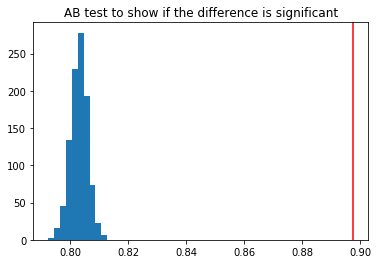

In [291]:
plt.hist(sampled_open_rate)
plt.axvline(np.mean(business_p1_Star_low.is_open), color="red")
plt.title("AB test to show if the difference is significant")

## <u> 3.2 Finding Two <u>

Stores open less than 66 hours per week are more likely to get better rating on Yelp (expect fastfood stores which have bad rating in general), Stores which open more than 66 hours per week need more reviews to reach a better rating on Yelp. 

###  <u> 3.2.1 Machine Learning - Decision Tree </u>

#### Data preparation for Mechine Learning 

In [117]:
df_clf = business.copy()

In [118]:
# Deleting the text columns 
df_clf.drop(columns=['address','attributes','business_id',\
                                     'categories','hours','latitude','longitude','name',\
                   'postal_code','city','state'], inplace=True)

In [119]:
# drop the original stars column
df_clf.drop(columns='stars',inplace=True)

In [120]:
df_clf.head()

,is_open,review_count,RestaurantsPriceRange2,BusinessAcceptsCreditCards,weekly_total_hours,parking_point,stars_bool
0,1,170,2.0,1.0,24.5,1.0,1
1,1,3,3.0,1.0,62.0,0.0,0
2,0,8,2.0,1.0,31.0,1.0,1
3,1,8,2.0,1.0,53.0,1.0,1
4,1,18,1.0,1.0,122.0,0.0,0


In [121]:
df_clf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58209 entries, 0 to 58208
Data columns (total 7 columns):
is_open                       58209 non-null int64
review_count                  58209 non-null int64
RestaurantsPriceRange2        58209 non-null float64
BusinessAcceptsCreditCards    58209 non-null float64
weekly_total_hours            58209 non-null float64
parking_point                 58209 non-null float64
stars_bool                    58209 non-null int64
dtypes: float64(4), int64(3)
memory usage: 3.1 MB


#### Decision tree

In [122]:
import sklearn as sk
import sklearn.tree as tree
from IPython.display import Image  
import pydotplus

In [123]:
# suppress Pandas future warning 
import warnings
warnings.filterwarnings('ignore')

In [124]:
Y = df_clf['stars_bool']
Y.head()

0    1
1    0
2    1
3    1
4    0
Name: stars_bool, dtype: int64

In [125]:
df_clf['stars_bool'].value_counts()

1    29287
0    28922
Name: stars_bool, dtype: int64

In [126]:
X = df_clf.drop(columns=['stars_bool'])

In [127]:
X.head()

,is_open,review_count,RestaurantsPriceRange2,BusinessAcceptsCreditCards,weekly_total_hours,parking_point
0,1,170,2.0,1.0,24.5,1.0
1,1,3,3.0,1.0,62.0,0.0
2,0,8,2.0,1.0,31.0,1.0
3,1,8,2.0,1.0,53.0,1.0
4,1,18,1.0,1.0,122.0,0.0


In [128]:
dt = tree.DecisionTreeClassifier(max_depth=2)

In [129]:
dt.fit(X,Y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=2,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

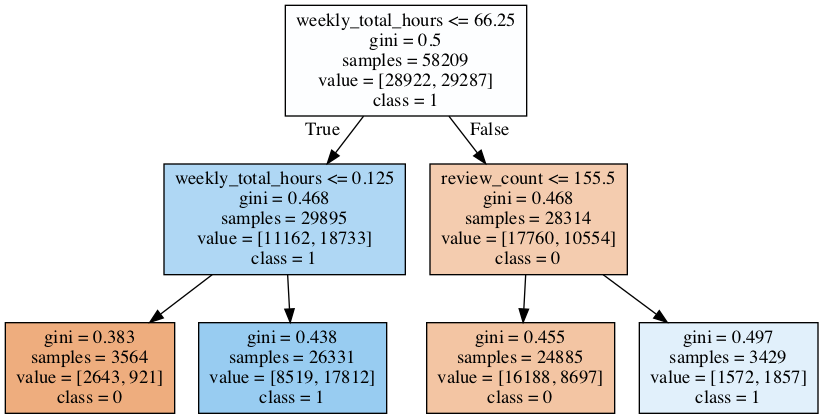

In [132]:
# This code will visualize a decision tree dt, trained with the attributes in X and the class labels in Y
dt_feature_names = list(X.columns)
dt_target_names = [str(s) for s in [0,1]]
tree.export_graphviz(dt, out_file='tree.dot', 
    feature_names=dt_feature_names, class_names=dt_target_names,
    filled=True)  
graph = pydotplus.graph_from_dot_file('tree.dot')
Image(graph.create_png())

- 1, The stores open less than 66.25 hours per week (9.5 hours per day)  and more than 0.125 hours per week are likely get good stars.
- 2, Stores open more than 66.25 hours per week and have review_count more than 155.5 have good stars;


### <u>3.2.2 Validate results and further exploration</u>

#### weekly_total_hours and stars

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [136]:
df1 = df_clf.copy()

In [139]:
df1['weekly_total_hours.bin']=pd.cut(df1['weekly_total_hours'],bins=[0,66.25,10000])
# no need to plot the stores open less than 0.125 hours per week

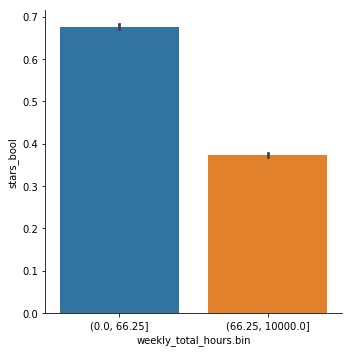

In [140]:
sns.factorplot(x='weekly_total_hours.bin',y='stars_bool',data=df1,kind='bar',aspect=1)

This bar chart validates the results from the left side of the decision tree. The stores open less than 66 hours per week get a better stars review on Yelp. To get deep into this result, I separate the stores by price range and categories to see what factors cause this phenomenon. 

#### weekly_total_hours , price range and stars

In [80]:
df2['weekly_total_hours.bin']=pd.qcut(df2.weekly_total_hours, 10)
groupby_stars = df2.groupby(['weekly_total_hours.bin','RestaurantsPriceRange2'])['stars'].mean()

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a581c69e8>)

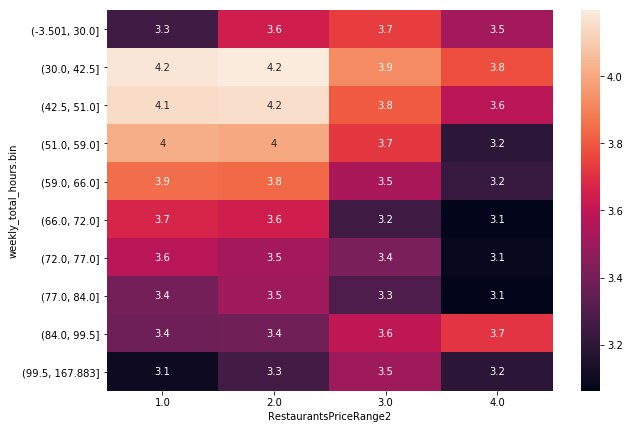

In [81]:
plt.subplots(figsize=(10,7))
sns.heatmap(groupby_stars.unstack(),annot=True)

Overall, we have the same results as the previous charts. But the pattern shows stronger for those stores with price range on 1 and 2. 
For the stores in price range 1 and 2, We seperate them by categories to see if this pattern can apply to every categories. 


#### weekly_total_hours affect stars by different categories

In [82]:

df3 = business_cat[["category", "weekly_total_hours", "name", "stars", "RestaurantsPriceRange2","review_count","stars_bool"]]

In [86]:
# only select the price range eqaul to 1 and 2
df3_pr_12 = df3[df3.RestaurantsPriceRange2 <= 2]
df3_pr_12.category.value_counts()[:20]

Restaurants                  25090
Food                         13724
Shopping                     12398
Beauty & Spas                 9268
Nightlife                     6284
Bars                          5763
American (Traditional)        4646
Sandwiches                    3941
Fast Food                     3577
Hair Salons                   3411
Coffee & Tea                  3393
Event Planning & Services     3311
Pizza                         3300
American (New)                3199
Fashion                       3007
Breakfast & Brunch            2960
Burgers                       2869
Mexican                       2813
Nail Salons                   2599
Home & Garden                 2395
Name: category, dtype: int64

In [87]:
df3_sub1 =df3[(df3.weekly_total_hours<=66) & (df3.RestaurantsPriceRange2 <= 2)]
df3_sub2=df3[(df3.weekly_total_hours>66) & (df3.RestaurantsPriceRange2 <= 2)]
print(len(df3_sub1), len(df3_sub2))

127159 121603


(<Figure size 720x360 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a57f55a58>)

Text(0.5,1,'weekly_total_hours lower and equal to 66')

(<Figure size 720x360 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a57ea0358>)

Text(0.5,1,'weekly_total_hours higer than 66')

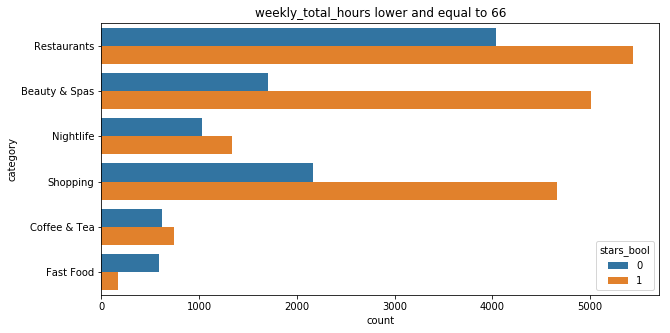

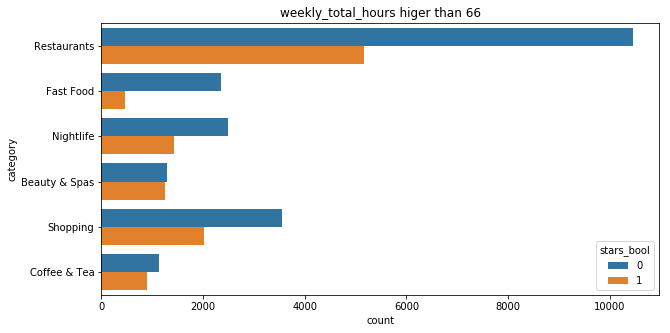

In [88]:
# only show the five categories we interest in 
specific_groups = ["Restaurants", "Shopping", "Beauty & Spas", "Nightlife", "Fast Food","Coffee & Tea"]
#
plt.subplots(figsize=(10,5))
sns.countplot(y="category", hue="stars_bool", data=df3_sub1.loc[df3_sub1.category.isin(specific_groups)])
plt.title("weekly_total_hours lower and equal to 66")
plt.subplots(figsize=(10,5))

sns.countplot(y="category", hue="stars_bool", data=df3_sub2.loc[df3_sub2.category.isin(specific_groups)])
plt.title("weekly_total_hours higer than 66")

In [149]:
df_fastfood.stars.mean()

2.8404848147116186

- The result shows in most categories, number of stores have higher stars is bigger than number of stores have lower stars when weekly_total_hours is less than 66 hours. 
- No matter how long the fast food resturant open, the stores have bad rating are more than good-rating stores. The  average stars is 2.8 way less than the average of other stores. 

So we investigate the review of those stores to see what the poeple complain mostly about fast food and those stores open more than 66 hours. 

#### Word cloud of fast food reviews

In [143]:
# find the fastfood store ids
df_fastfood = business_cat[business_cat.category=='Fast Food']

In [144]:
fastfood_id =df_fastfood.business_id
fastfood_id.head()

4      1Dfx3zM-rW4n-31KeC8sJg
64     y-1sMhUMubrHWdIW4FaE8w
91     vg4ynLZ0yJ89pT4s_CEMzQ
98     ItmLljzhwhuyyvekNs4Ymg
110    El6Bum4I-0VWJRgzbtscJQ
Name: business_id, dtype: object

In [145]:
fasfood_id_list = list(fastfood_id)

In [148]:
review_fastfood = review[review.business_id.isin(fasfood_id_list)]

In [154]:
# get a closer look at fastfood stores with lower stars
review_fastfood2 = review_fastfood[review_fastfood.stars < 3]

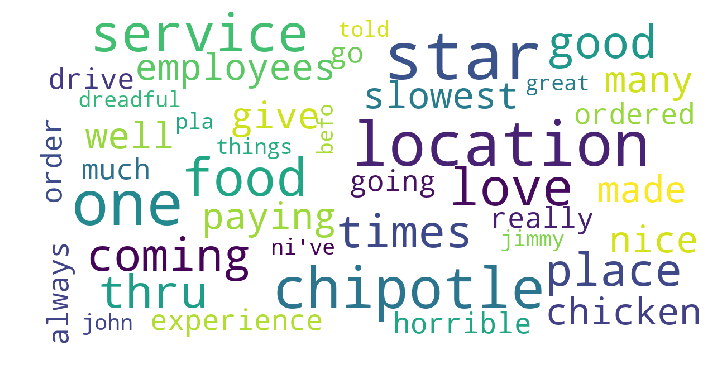

In [155]:
show_wordcloud(review_fastfood2['text'])
#show_wordcloud(df['categories'])

This word cloud give us some hints about why peopel like to give low stars for fastfood stores. 
- location
- food
- service
- slowest
- experiences
- dreadful
- horrible

Poeple complain most about the location, food, services and the rapidness of serving food. But, there are still some good words showing such as good, well and love. Therefore, we retrieve the original text from this dataframe that contains word "good". 

In [147]:
for i in review_fastfood1['text']:
    if "good" in i:
        print(i)
        break

i was told so many great things about this place but my entire experience was awful. the food wasn't very good, way too greasy. my fries were luke warm and my tray was literally covered in grease. i needed about 50 napkins and a shower after that. the service was pretty awful too. i can't believe i paid $14 for a small meal with no extra fixings. on national cheeseburger day of all days too. such a disappointment and i've never gone back since. best thing about it was the soda, but that's pretty difficult to mess up.


From the text review above, we can see that this review has strongly negetive attitude. But, those good words still show a big portion in word cloud because the word cloud just simply calculate the frequency of words shows in text. Those good words here don't really mean good such as "it was told so many great thing, but..." and "wasn't very good".We also found the same rules in the finding three. When we want to dig into those negative reivews, we often see a number of positive words which may affect the accuracy of sentimental analysis. 

#### Word cloud of reviews for the stores opening more than 66 a week

In [156]:
# find the stores ids
df_stores_openlonger = business[business.weekly_total_hours > 66]

In [158]:
openlonger_id_list = list(df_stores_openlonger.business_id)
len(openlonger_id_list)

28314

In [159]:
review_openlonger = review[review.business_id.isin(openlonger_id_list)]

In [164]:
# get a closer look at fastfood stores with lower stars
review_openlonger2 = review_openlonger[review_openlonger.stars < 3]

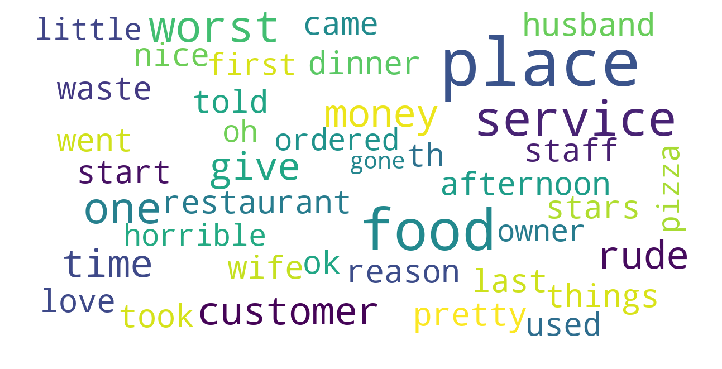

In [165]:
show_wordcloud(review_openlonger2['text'])
#show_wordcloud(df['categories'])

This word cloud give us some hints about why peopel like to give low stars for the stores open longer than 66 hours
- place
- service
- employees
- food
- staff
- rude
- waste
- dreadful
- horrible

Ignoring the good words, people mainly complain about the services of those resutrant like rudeness of employees and bad quality of food. 

#### weekly_total_hours , review_count and stars

For the right side of decision tree, We made one heat map and one line chart to validate the results.

In [73]:
df2 = business.copy()

In [74]:
# the relationship between stars_bool, weekly_total_hours and RestaurantsPriceRange2
df2['weekly_total_hours.bin']=pd.qcut(df2.weekly_total_hours, 10)
df2['review_count.bin'] = pd.qcut(df2.review_count, 10)
groupby_stars = df2.groupby(['weekly_total_hours.bin','review_count.bin'])['stars'].mean()

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a5876c2e8>)

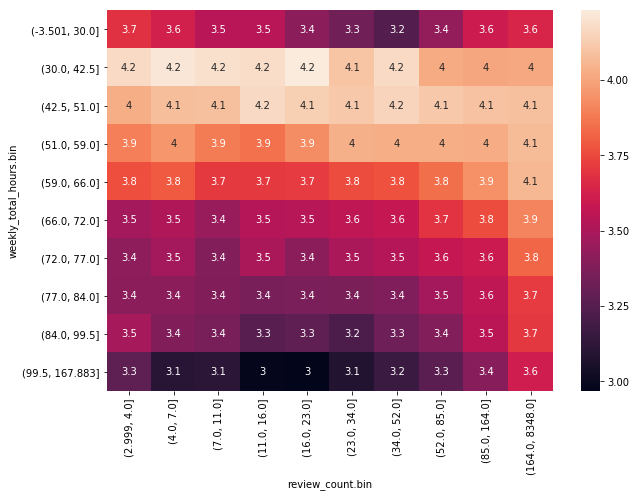

In [75]:
plt.subplots(figsize=(10,7))
sns.heatmap(groupby_stars.unstack(),annot=True)

In [76]:
df_60 = business.copy()

In [77]:

df_60['weekly_total_hours_60'] = business.weekly_total_hours.apply(lambda x: ">60" \
                                                                   if x>60 else "<=60")
df_60.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,RestaurantsPriceRange2,BusinessAcceptsCreditCards,weekly_total_hours,parking_point,stars_bool,weekly_total_hours_60
0,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC,2.0,1.0,24.5,1.0,1,<=60
1,"4545 E Tropicana Rd Ste 8, Tropicana","{'RestaurantsPriceRange2': '3', 'GoodForKids':...",gbQN7vr_caG_A1ugSmGhWg,"Hair Salons, Hair Stylists, Barbers, Men's Hai...",Las Vegas,"{'Monday': '10:0-19:0', 'Tuesday': '10:0-19:0'...",1,36.099872,-115.074574,Supercuts,89121,3,3.5,NV,3.0,1.0,62.0,0.0,0,>60
2,5940 W Union Hills Dr,"{'RestaurantsPriceRange2': '2', 'ByAppointment...",Y6iyemLX_oylRpnr38vgMA,"Nail Salons, Beauty & Spas, Day Spas",Glendale,"{'Tuesday': '12:0-18:0', 'Wednesday': '10:0-18...",0,33.654815,-112.188568,Vita Bella Fine Day Spa,85308,8,5.0,AZ,2.0,1.0,31.0,1.0,1,<=60
3,21689 Lorain Rd,"{'ByAppointmentOnly': 'False', 'BusinessAccept...",4GBVPIYRvzGh4K4TkRQ_rw,"Beauty & Spas, Nail Salons, Day Spas, Massage",Fairview Park,"{'Tuesday': '9:0-21:0', 'Wednesday': '9:0-21:0...",1,41.440825,-81.854097,Options Salon & Spa,44126,8,4.5,OH,2.0,1.0,53.0,1.0,1,<=60
4,2450 E Indian School Rd,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...",1Dfx3zM-rW4n-31KeC8sJg,"Restaurants, Breakfast & Brunch, Mexican, Taco...",Phoenix,"{'Monday': '7:0-0:0', 'Tuesday': '7:0-0:0', 'W...",1,33.495194,-112.028588,Taco Bell,85016,18,3.0,AZ,1.0,1.0,122.0,0.0,0,>60


In [78]:
df_60['review_count.bin'] = pd.qcut(business.review_count, 10)

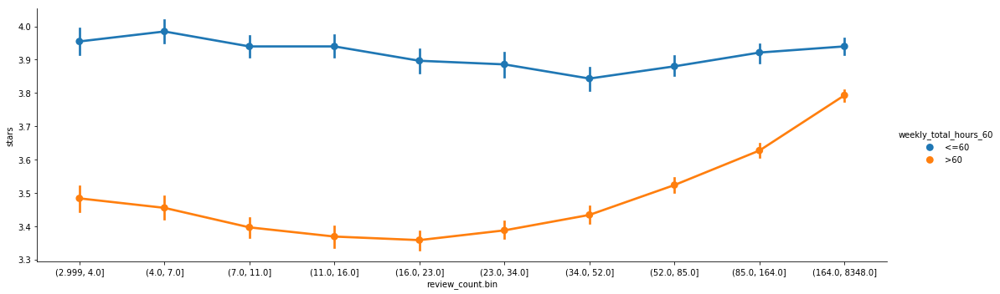

In [79]:
sns.factorplot(x='review_count.bin', y='stars', hue='weekly_total_hours_60',\
               data=df_60, aspect=3)

The number of review_count has little impact on rating stars for the stores open less time, but rating stars increase along with review_count increasing for the stores open longer time per week. 

### <u>3.2.2 Managerial insights</u>

Stores owners can have some suggestion from our results:
- 1. The longer business hour can harm the rating level on Yelp, which may let the bad impact on your stores' reputation.
- 2. Owners of fast food don't need to worry about your low level of stars on Yelp since it's normal in this industry. And people complain the most about fast food is the location, services, and rapidness of serving food. they can improve those aspects to improve your business.
- 3. For those store owners open stores longer than 66 hours, if they want to increase rating stars on Yelp, they can focus on the attitude of their employees, quality of services, and bad food quality that may be caused by chefs' tiredness with long-hours working. 
- 4. Store owners who open stores longer time can encourage customers to write reviews on Ylep to increase store's star level. a good rating may attract more customers. 

## <u> 3.3  Finding Three <u>

Earlier in the project we gave a very high-level understanding of sentiment analysis by illustrating worlds clouds for high-star and low-star reviews. In this section, we will go one step forward by exploring with machine learning, as well as explicitely cycling through each review to find out the number of positive and negative words.

**Main Question:** Can a simple count of positive and negative words accurately predict if a review is highly rated or low rated?

In [298]:
df_pos_neg = pd.read_csv("yelp_academic_dataset_review_SentimentAttached.csv")

In [299]:
df_pos_neg['stars_bool'] = df_pos_neg.stars.apply(lambda x: 1 if x >= 3.7 else 0)

In [300]:
df_pos_neg.dropna(inplace=True)

In [301]:
Y = df_pos_neg['stars_bool']

In [302]:
X = df_pos_neg.drop(columns=['stars_bool','Unnamed: 0','business_id','cool','date','funny','review_id',\
                         'stars','text','useful','user_id','stop_words'])

In [304]:
X.head()

,negative_words,positive_words
0,2.0,0.0
1,4.0,25.0
2,0.0,11.0
3,0.0,11.0
4,23.0,14.0


In [305]:
df_pos_neg['stars_bool'].value_counts()

1    4402065
0    2283831
Name: stars_bool, dtype: int64

In [314]:
import sklearn as sk
import sklearn.tree as tree
from IPython.display import Image  
import pydotplus

In [315]:
dt = tree.DecisionTreeClassifier(max_depth=2)

In [316]:
dt.fit(X,Y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=2,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

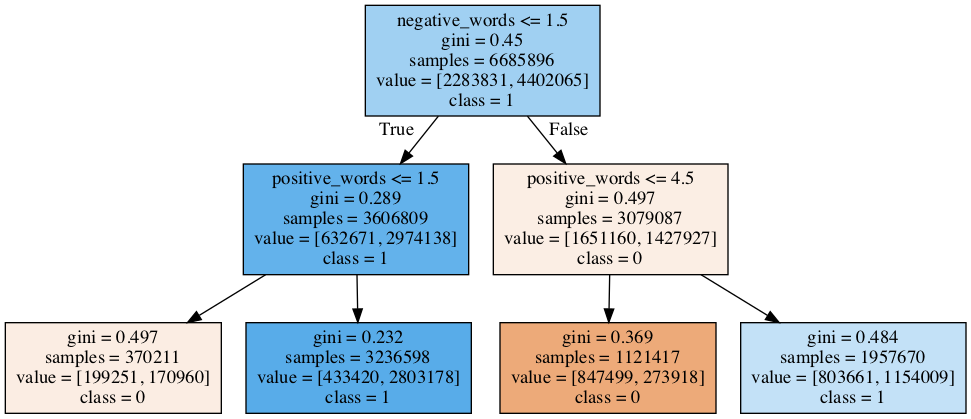

In [317]:
# This code will visualize a decision tree dt, trained with the attributes in X and the class labels in Y
dt_feature_names = list(X.columns)
dt_target_names = [str(s) for s in Y.unique()]
tree.export_graphviz(dt, out_file='tree.dot', 
    feature_names=dt_feature_names, class_names=dt_target_names,
    filled=True)  
graph = pydotplus.graph_from_dot_file('tree.dot')
Image(graph.create_png())

Decision Tree validates our intial ideas. Generally states that more negative words means negative review, and more positive words means positive review.

In [318]:
#### Calculate the AUC socre to select best-performance calssifcation algorithm

In [319]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

clfs = [DecisionTreeClassifier(), sk.ensemble.RandomForestClassifier(n_jobs=-1), sk.naive_bayes.GaussianNB(),
        sk.linear_model.LogisticRegression(n_jobs=-1),sk.tree.DecisionTreeClassifier(),sk.ensemble.AdaBoostClassifier(),
        QuadraticDiscriminantAnalysis(),MLPClassifier()]

In [320]:
from sklearn.model_selection import KFold

In [321]:
nfolds = 10
kf = KFold(n_splits=nfolds,random_state=0,shuffle=True)

In [322]:
maxAUC = -1
bestCL = ""
for cl in clfs:
    auc = sk.model_selection.cross_val_score(cl,X,Y,cv=kf,n_jobs=-1,scoring='roc_auc').mean()
    print (str(cl) + ' ' + str(auc))
    if auc > maxAUC:
        bestCL = cl
        maxAUC = auc
print('***********************************************')
print ('Best is... ' + str(bestCL) + ' ' + str(maxAUC))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best') 0.8422553313565171
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators='warn',
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False) 0.8422708673002937
GaussianNB(priors=None, var_smoothing=1e-09) 0.8064654784046217
L

In [323]:
# link for how to draw precision and recall curve
#https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html
classifer = MLPClassifier()

In [324]:
from sklearn.model_selection import train_test_split

# Limit to the two first classes, and split into training and test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.5,
                                                    random_state=1)

In [325]:
classifer.fit(X_train, y_train)
y_score = classifer.predict(X_test)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [326]:
from sklearn.metrics import average_precision_score
average_precision = average_precision_score(y_test, y_score)

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision))

Average precision-recall score: 0.80


Text(0.5, 0, 'Recall')

Text(0, 0.5, 'Precision')

(0.0, 1.05)

(0.0, 1.0)

Text(0.5, 1.0, '2-class Precision-Recall curve: AP=0.80')

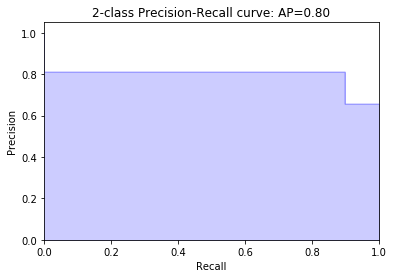

In [327]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from inspect import signature

precision, recall, _ = precision_recall_curve(y_test, y_score)

# In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
step_kwargs = ({'step': 'post'}
               if 'step' in signature(plt.fill_between).parameters
               else {})
plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
          average_precision))
plt.show()

Looks good.

In [328]:
recall, precision

(array([1.        , 0.89919013, 0.        ]),
 array([0.65813527, 0.81122068, 1.        ]))

In [334]:
y_predict = classifer.predict_proba(X)
y_predict = [yi[1] for yi in y_predict]

In [338]:
df_pos_neg["stars_bool_predict"] = y_predict
df_pos_neg.head(5)

,Unnamed: 0,business_id,cool,date,funny,review_id,stars,text,useful,user_id,negative_words,positive_words,stop_words,stars_bool,stars_bool_predict
0,0,ujmEBvifdJM6h6RLv4wQIg,0,2013-05-07 04:34:36,1,Q1sbwvVQXV2734tPgoKj4Q,1.0,total bill for this horrible service? over $8gs. these crooks actually had the nerve to charge us $69 for 3 pills. i checked online the pills can be had for 19 cents each! avoid hospital ers at all costs.,6.0,hG7b0MtEbXx5QzbzE6C_VA,2.0,0.0,18.0,0,0.081521
1,1,NZnhc2sEQy3RmzKTZnqtwQ,0,2017-01-14 21:30:33,0,GJXCdrto3ASJOqKeVWPi6Q,5.0,"i *adore* travis at the hard rock's new kelly cardenas salon! i'm always a fan of a great blowout and no stranger to the chains that offer this service; however, travis has taken the flawless blowout to a whole new level! \n\ntravis's greets you with his perfectly green swoosh in his otherwise perfectly styled black hair and a vegas-worthy rockstar outfit. next comes the most relaxing and incredible shampoo -- where you get a full head message that could cure even the very worst migraine in minutes --- and the scented shampoo room. travis has freakishly strong fingers (in a good way) and use the perfect amount of pressure. that was superb! then starts the glorious blowout... where not one, not two, but three people were involved in doing the best round-brush action my hair has ev...",0.0,yXQM5uF2jS6es16SJzNHfg,4.0,25.0,163.0,1,0.891262
2,2,WTqjgwHlXbSFevF32_DJVw,0,2016-11-09 20:09:03,0,2TzJjDVDEuAW6MR5Vuc1ug,5.0,"i have to say that this office really has it together, they are so organized and friendly! dr. j. phillipp is a great dentist, very friendly and professional. the dental assistants that helped in my procedure were amazing, jewel and bailey helped me to feel comfortable! i don't have dental insurance, but they have this insurance through their office you can purchase for $80 something a year and this gave me 25% off all of my dental work, plus they helped me get signed up for care credit which i knew nothing about before this visit! i highly recommend this office for the nice synergy the whole office has!",3.0,n6-Gk65cPZL6Uz8qRm3NYw,0.0,11.0,70.0,1,0.942971
3,3,ikCg8xy5JIg_NGPx-MSIDA,0,2018-01-09 20:56:38,0,yi0R0Ugj_xUx_Nek0-_Qig,5.0,"went in for a lunch. steak sandwich was delicious, and the caesar salad had an absolutely delicious dressing, with a perfect amount of dressing, and distributed perfectly across each leaf. i know i'm going on about the salad ... but it was perfect.\n\ndrink prices were pretty good.\n\nthe server, dawn, was friendly and accommodating. very happy with her.\n\nin summation, a great pub experience. would go again!",0.0,dacAIZ6fTM6mqwW5uxkskg,0.0,11.0,39.0,1,0.942971
4,4,b1b1eb3uo-w561D0ZfCEiQ,0,2018-01-30 23:07:38,0,11a8sVPMUFtaC7_ABRkmtw,1.0,"today was my second out of three sessions i had paid for. although my first session went well, i could tell meredith had a particular enjoyment for her male clients over her female. however, i returned because she did my teeth fine and i was pleased with the results. when i went in today, i was in the whitening room with three other gentlemen. my appointment started out well, although, being a person who is in the service industry, i always attend to my female clientele first when a couple arrives. unbothered by those signs, i waited my turn. she checked on me once after my original 30 minute timer to ask if i was ok. she attended my boyfriend on numerous occasions, as well as the other men, and would exit the room without even asking me or looking to see if i had any irritation. half ...",7.0,ssoyf2_x0EQMed6fgHeMyQ,23.0,14.0,460.0,0,0.050902


(array([  19671.,   80435.,   40752.,  175917.,  125502.,  244626.,
         361836.,  621605., 1331639., 1400082.]),
 array([4.44872755e-04, 1.00400252e-01, 2.00355630e-01, 3.00311009e-01,
        4.00266388e-01, 5.00221767e-01, 6.00177146e-01, 7.00132525e-01,
        8.00087904e-01, 9.00043282e-01, 9.99998661e-01]),
 <a list of 10 Patch objects>)

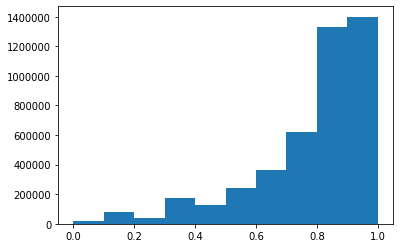

In [336]:
plt.hist(df_pos_neg.loc[(df_pos_neg.stars_bool == 1)].stars_bool_predict)

(array([369229., 415074., 123235., 306922., 149245., 193022., 195373.,
        205366., 224355., 102010.]),
 array([5.97132494e-05, 9.99936405e-02, 1.99927568e-01, 2.99861495e-01,
        3.99795422e-01, 4.99729350e-01, 5.99663277e-01, 6.99597204e-01,
        7.99531131e-01, 8.99465059e-01, 9.99398986e-01]),
 <a list of 10 Patch objects>)

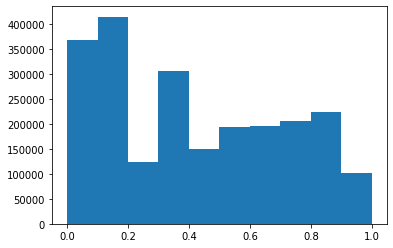

In [337]:
plt.hist(df_pos_neg.loc[(df_pos_neg.stars_bool == 0)].stars_bool_predict)

- when people giving a high score they usually more straight forward
- when people giving a lower score people using multiple way to discribe it, being very creative and sacasitic

This answers our initial question. The answer is yes and no. For positive reviews, a sentiment analysis can accurately, for the most part, detect if a review is positive. When performing a groupby (For each star value, find the sum amount of positive words used), we find the the number of positive words skews heavily to 4 and 5 star reviews.

On the other hand, when counting the number of negative words used in each star values, the negative word distribution is all over the place. **A Lot** of negative words appear in 1,2,3,4, and 5 star reviews. And many positive words appear in lowly-rated reviews as well. 

A sentiment analysis doesn't accurately predict negative review sentiment too well. We have trouble accounting for sarcasm and other implicit language mechanisms, at least with the tools at our current disposal.

example below

Here, we're taking a dive deeper to try and find discrepancies. Below is a dataframe of 5 star reviews without many positive words. Perhaps this can serve as intermediary steps to design a product to find outliers?

In [342]:
df_pos_neg.loc[(df_pos_neg.stars == 5) & (df_pos_neg.stars_bool_predict<=0.1)& (df_pos_neg.positive_words <= 5)]

,Unnamed: 0,business_id,cool,date,funny,review_id,stars,text,useful,user_id,negative_words,positive_words,stop_words,stars_bool,stars_bool_predict
1714,1714,yJlqyI_w9bQ3I2nCJNYLQQ,0,2014-07-13 14:34:11,0,ajmpB8oHjn8aNsH949nYhA,5.0,"all my family dogs have gone to caring hands, so when i finally got a puppy of my own, i knew exactly where to go. the staff at caring hands really know what they're doing. penny, my puppy, needed to get her nails trimmed. since getting bigger, she's gotten more difficult to trim so i brought her to caring hands. after three appointments, they finally got her nails trimmed (by no fault of their own - i'm telling you, penny is a monster sometimes). penny has never seemed stressed or unhappy after leaving and everyone there is extremely kind - they even remembered my childhood dog, bear! five stars. :)",1.0,phYuNB-StpAz2mJEZ4H8zg,4.0,0.0,61.0,1,0.027113
2387,2387,HhMXqS8h0SPOXv56Dc510w,0,2016-07-14 19:42:11,0,qqCcQequq7rDfoJYHtzzaA,5.0,"i went to sarah with an acute pain through my shoulder and chronic wrist pain. after a very thorough examination she told me that the pain was due to problems at the c5-c6 level of my spine - i was convinced that this was not the case and actually argued with her. she massaged and gently manipulated my neck at the c5-c6 level. with each subsequent session she made more progress and now i am starting to ride my bike again because i am pain free. all the other professionals i spoke to wanted to give my drugs - sarah gave me her time and expertise, and that's priceless",0.0,BvDrq18o8rukuG4N3JllzQ,6.0,3.0,66.0,1,0.095473
2699,2699,I7opGbXbKeNuyWvC486vNA,0,2018-05-28 21:36:55,0,cA4kSrdYqZfO1FJRGB7QJA,5.0,"highly suggest for wedding hair! i booked this place for my march 10, 2018 wedding. i was really indecisive about my wedding hair. i brought in pictures of my dress and explained at least one thing i was sure about, and then the hair stylist was able to read my mind and did my hair exactly how i wanted it when i wasn't even sure how i wanted it. she must have been clairvoyant. highly suggested for unsure brides.",0.0,n5kvsYIIPUVrARu0pkaazQ,2.0,0.0,51.0,1,0.081521
3542,3542,ABTGvHgWmCMeXCkW0t86GA,0,2016-10-26 15:57:53,0,yYk2wCZHY77KyQe7XelVuw,5.0,once again andy has totally come thru and rescued my car!! my engine light popped on last night and scared the daylights out of me...i just knew i was about to go into debt! i would have spent my whole paycheck at the lexus dealership..but andy kept my expenses down! i will not go anywhere else!,0.0,WVz_H-0Bbfk4l1vvFSO8Bg,2.0,0.0,37.0,1,0.081521
8132,8132,Qt7EOWunbxf16Gstm1KtVw,0,2017-03-15 06:52:45,0,Y3sP1lI1CrTpk6QKJ99ujA,5.0,"dr. thosani is a thorough professional. she performed moh's surgery on my nose for basal cell carcinoma and an annual skin check. plastic surgeon, dr. stutman tore a small piece of skin while closing the area on my nose, causing a raised scar. it is unlikely i would use him again.",2.0,asItVgPyD9584jKDkVoR1Q,2.0,0.0,24.0,1,0.081521
8709,8709,YRyYbOSwvHkZsZOLv98oQg,0,2012-11-06 06:30:36,1,XNUwZYgRzSqbP6E2tUK8Mw,5.0,i think people have to think reallyreally hard to find something to complain about here.,1.0,9i51HA_WjE_eTDheEwA-zg,2.0,0.0,11.0,1,0.081521
9235,9235,LYWbyu1EQM2o5hwHG5_Ldg,1,2013-04-10 22:20:19,0,IwX5WUJavqWGS4i3_C7LYA,5.0,"let me start off by saying service was beyond awesome here. the first dish i ordered, i did not realize was finished in the pan, and fried. i hate friend, or pan friend fish period. i told the waiter what i wanted. the only fish they had not friend or finished in the pan was the halibut. so the chef made a special halibut dish for me int he over that was seriously, to die for!",2.0,ERA4e6rMOLbKP58OM2NuFQ,6.0,1.0,46.0,1,0.027651
10037,10037,PjEls_NCOQ0m4tJPvcTY8w,0,2013-05-29 02:15:15,0,LQd-Tquk10ZR8i_pUx9fCA,5.0,why does all that crazy stuff happen in vegas? fat tuesday.,0.0,Jl7wukjs3Y0WSQOQQ1vkgw,2.0,0.0,5.0,1,0.081521
10148,10148,i41qYGIC0t5s0TuRBQz04Q,0,2016-06-12 00:46:14,

In [339]:
df_pos_neg.text[8132]

"dr. thosani is a thorough professional. she performed moh's surgery on my nose for basal cell carcinoma and an annual skin check. plastic surgeon, dr. stutman tore a small piece of skin while closing the area on my nose, causing a raised scar. it is unlikely i would use him again."

Positive review, but with few positive words. Do we include this? How do we detect positive sentiment with few positive buzzwords?

In [340]:
df_pos_neg.text[10148]

"after one month trouble with the unit! but the service has been continuously poor. now on a saturday in the heat of arizona's summer, we had to call numerous times to get someone to call back to tell us they can't come for hours. they need to have service people in the summer!! now after waiting hours still nobody!!~ with all the companies out there who needs this kind of aggravation after spending 8000.00. they have since fired the installers who were so terrible and made good on everything!!!"

Positive review, but with negative sentiment. Was this a mistake on the reviewers part? Do we include this in our algorithm? How do we account for this?

In [341]:
df_pos_neg.text[11485]

'weak. if youre thinking about eating here change your mind and go to los tacos. \nbomb. bomb bomb bomb booooommmmmbbbb'

Very confusing. How do computers detect and classify this??